# Inteligência Computacional
## Trabalho Final - Classificação de Imagens
### Alunos:
 - Felipe Martins Lemos de Morais
 - Maria Izamara Coutinho
 - Gabriel Siqueira
 - Fernando Garamvolgyi
 - Vinícius Nascimento
 - Pedro Santos

Neste trabalho final será realizada a classificação de imagens, que é a determinação de uma classe de uma figura com base nos seus pixels. Para isso, será utilizado o dataset MNIST, que possui 60 mil imagens em tom de cinza, de tamanho 28x28 pixels.

## An data overview (1ST step)

In [1]:
# libraries
import pandas as pd
import optuna
from sklearn.ensemble import RandomForestClassifier
from results import Fold
from evaluation import Experiment, GoalOptimizationRandomForest
from method import ScikitLearnMachineLearning
from work_methods import parameters_graph, show_results

# global categories
numbers_names = ['0','1','2','3','4','5','6','7','8','9']
numbers_values = [x for x in range(0,10,1)]
numbers = dict(zip(numbers_values,numbers_names))

## Use the classifier methods without any input filter (2ND step)

In [2]:
file_name = 'mnist_evaluation.csv'

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

# generate fold and p experiment
folds = Fold.generate_k_folds(df_data,val_k=5,col_category='y_class',
                            num_threshold=1,seed=1,
                            num_folds_validation=3,num_threshold_validation=2)

### Random Forrest Classifier 28x28

In [3]:
clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnMachineLearning(clf_rf)
exp = Experiment(folds,ml_method, GoalOptimizationRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calculate_results()

[I 2023-11-30 12:32:50,726] A new study created in memory with name: no-name-729dab94-5836-4cb2-81ce-d65b90006ad2
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:111: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:112: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/results.py:70: UndefinedMetricWarning: There is no predicted elements for this category 0 precisio set as zero.
  warnings.warn("There is no predicted elements for this category "+str(category)+" prec

In [4]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_trees,state
3,3,0.744348,2023-11-30 12:32:51.017284,2023-11-30 12:32:51.415145,0 days 00:00:00.397861,0.163638,0.006228,5,COMPLETE
6,6,0.738639,2023-11-30 12:32:51.748119,2023-11-30 12:32:52.125095,0 days 00:00:00.376976,0.219455,0.014733,4,COMPLETE
4,4,0.644269,2023-11-30 12:32:51.415727,2023-11-30 12:32:51.504663,0 days 00:00:00.088936,0.008135,0.019708,5,COMPLETE
2,2,0.516017,2023-11-30 12:32:50.892709,2023-11-30 12:32:51.016134,0 days 00:00:00.123425,0.172780,0.093130,2,COMPLETE
9,9,0.363101,2023-11-30 12:32:52.355861,2023-11-30 12:32:52.474885,0 days 00:00:00.119024,0.163679,0.235499,3,COMPLETE
5,5,0.321714,2023-11-30 12:32:51.506025,2023-11-30 12:32:51.747580,0 days 00:00:00.241555,0.496695,0.388678,5,COMPLETE
1,1,0.298297,2023-11-30 12:32:50.830507,2023-11-30 12:32:50.891712,0 days 00:00:00.061205,0.073378,0.151166,1,COMPLETE
7,7,0.260307,2023-11-30 12:32:52.125728,2023-11-30 12:32:52.217012,0 days 00:00:00.091284,0.111096,0.315703,3,COMPLETE
8,8,0.233918,2023-11-30 12:32:52.217637,2023-11-30 12:32:52.355183,0 days 00:00:00.137546,0.302326,0.481135,4,COMPLETE
0,0,0.228586,2023-11-30 12:32:50.728211,2023-11-30 12:32:50.829723,0 days 00:00:00.101512,0.360162,0.208511,1,COMPLETE


In [5]:
parameters_graph(exp.studies_per_fold[0].trials)

<IPython.core.display.Javascript object>

Random Forest 28x28
Macro f1: 0.7514689672466619

Accuracy: 0.7530562347188264



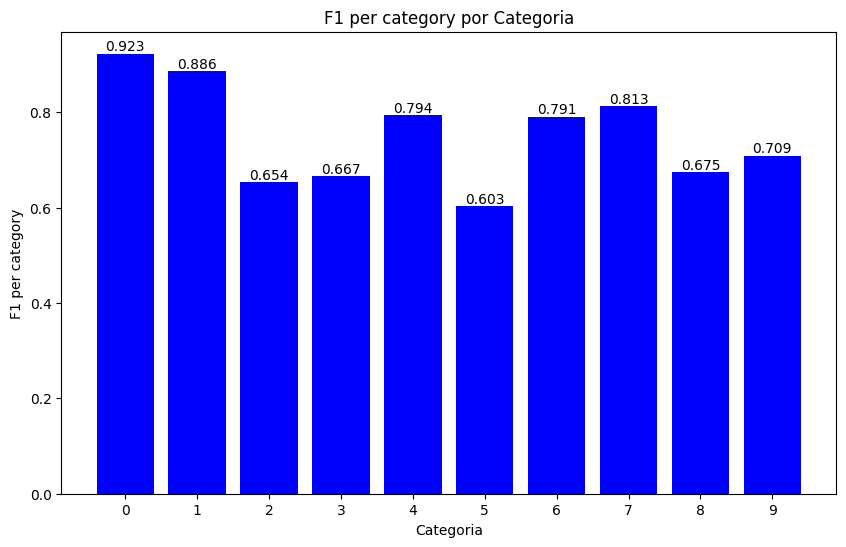

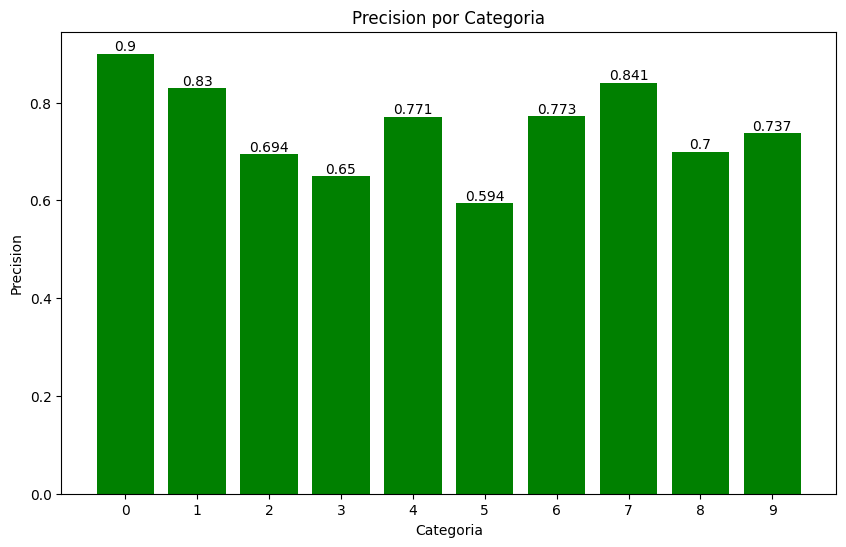

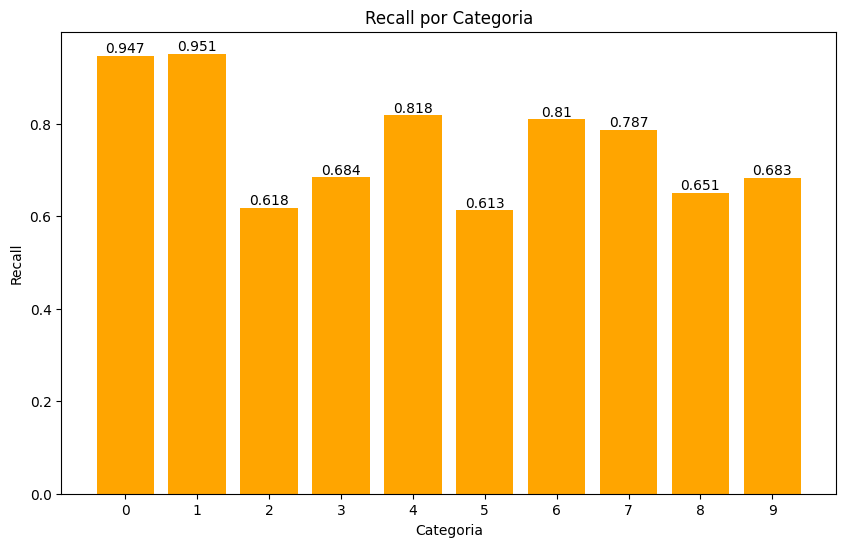

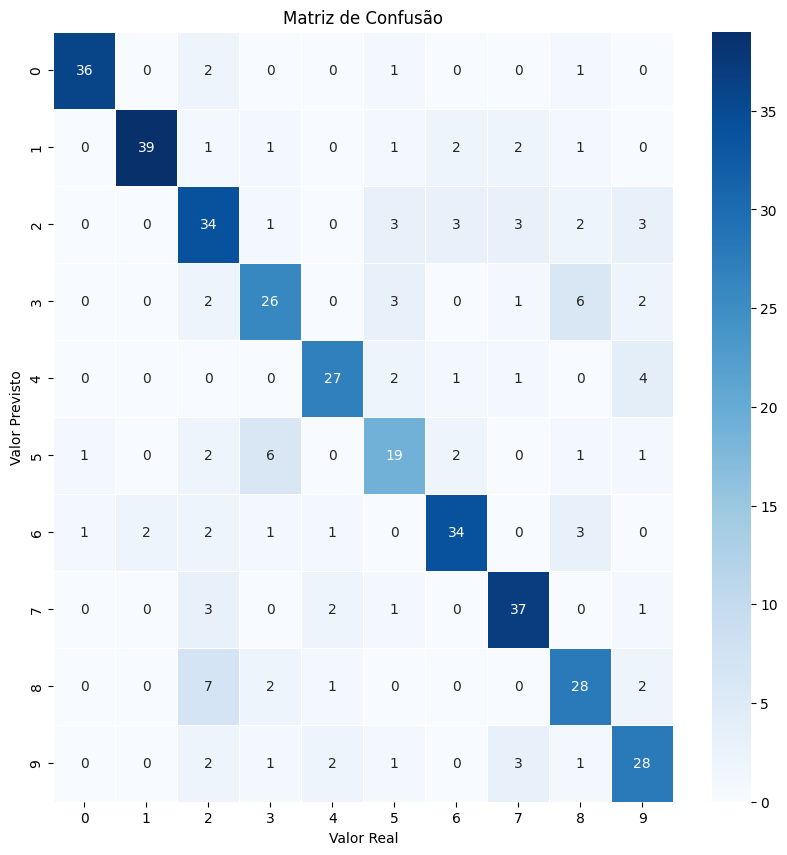


Macro f1: 0.7908576872191727

Accuracy: 0.7921760391198044



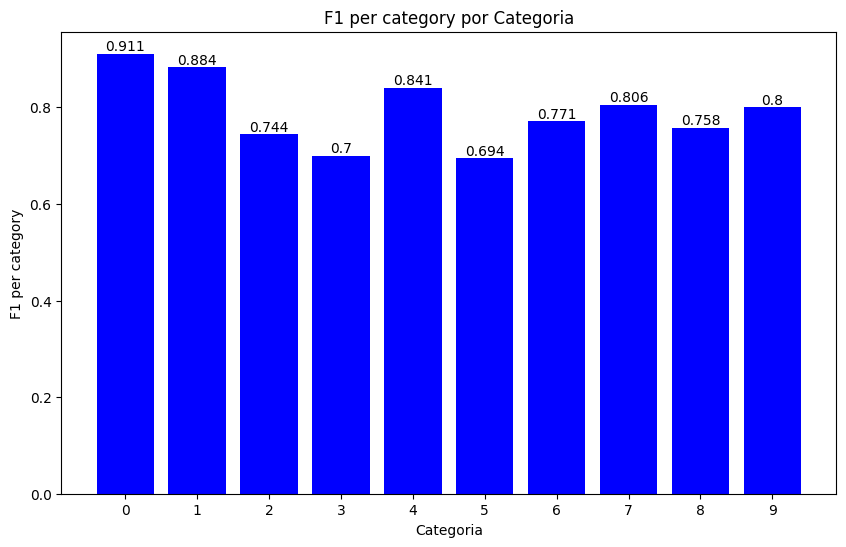

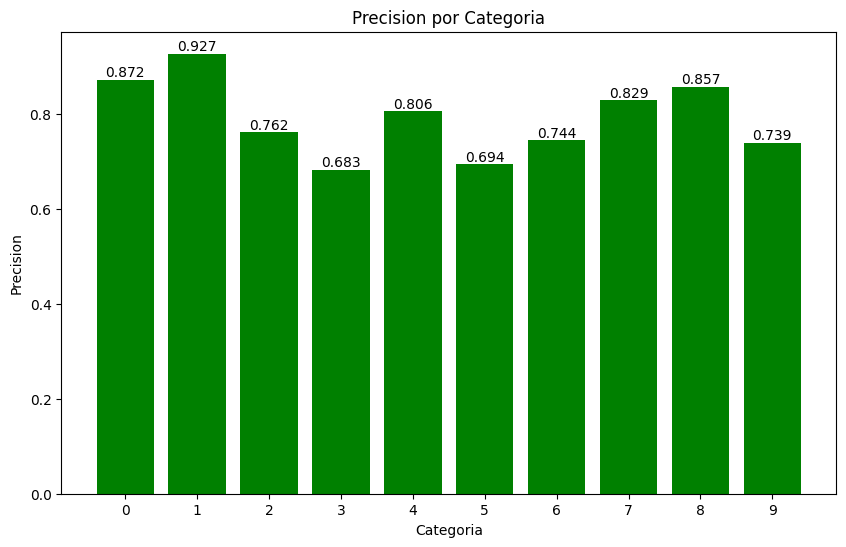

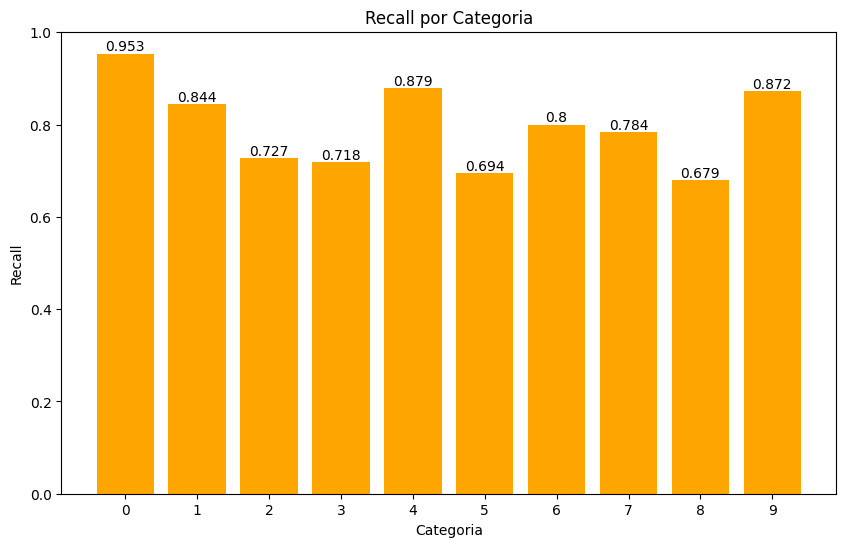

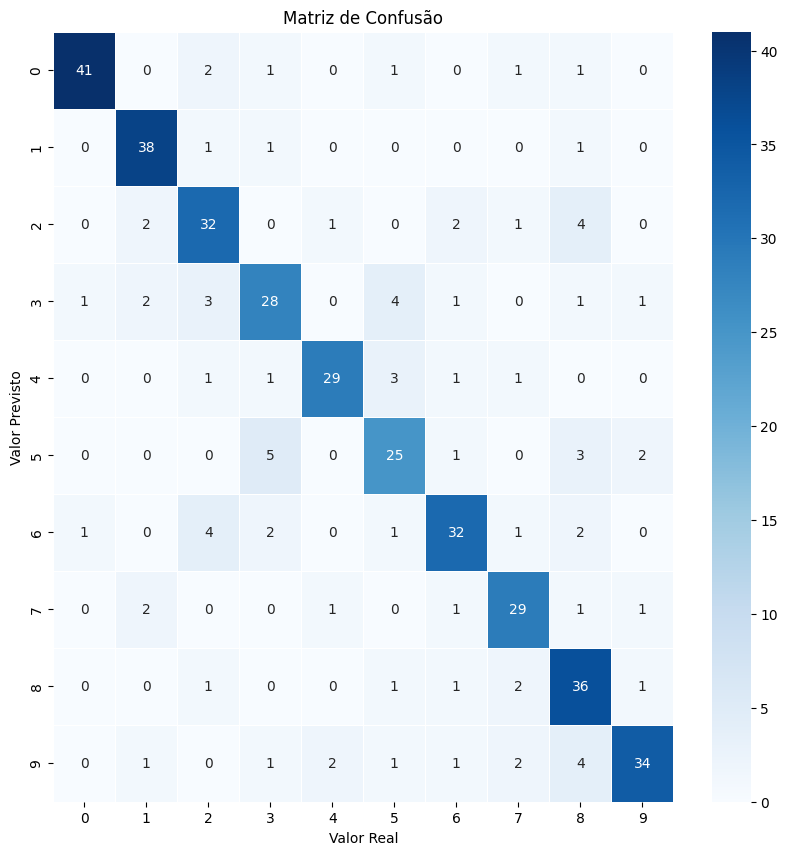


Macro f1: 0.7423183576923482

Accuracy: 0.7457212713936431



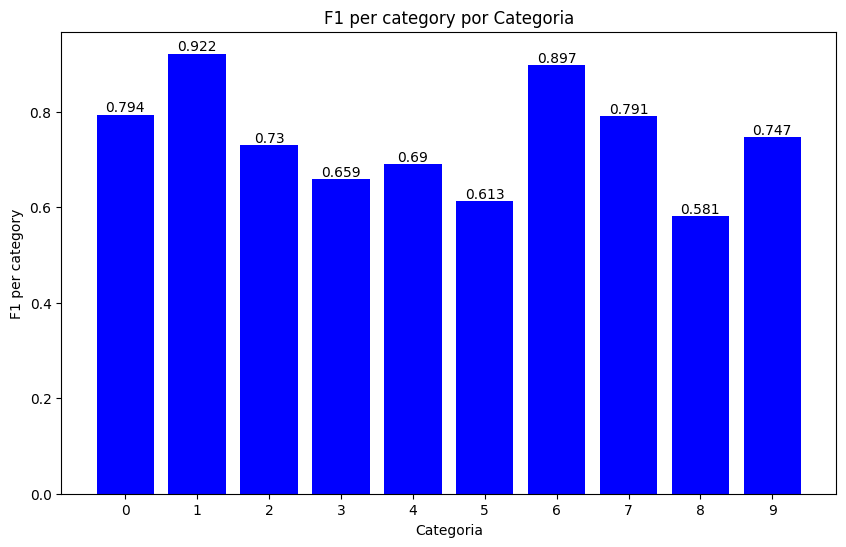

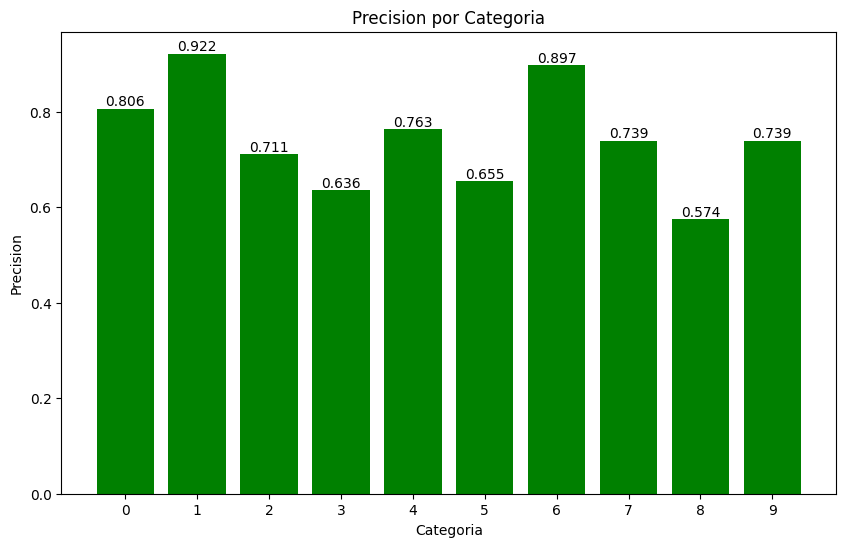

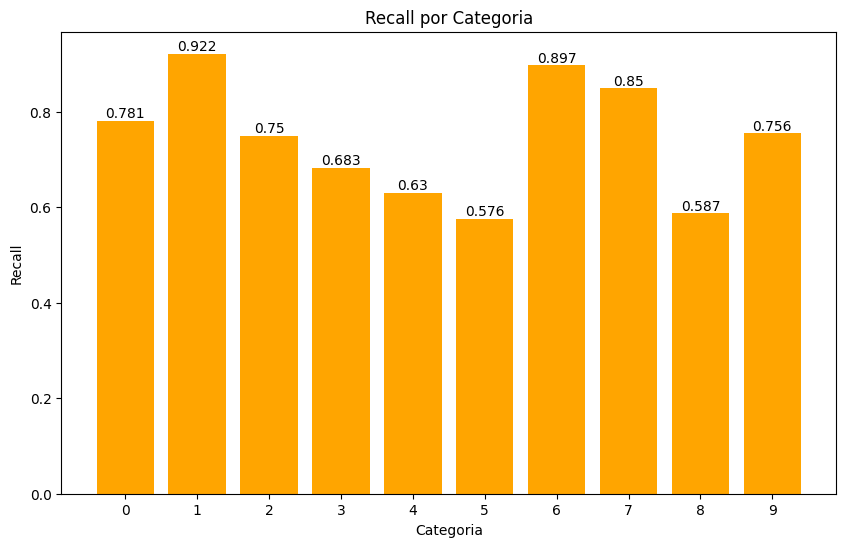

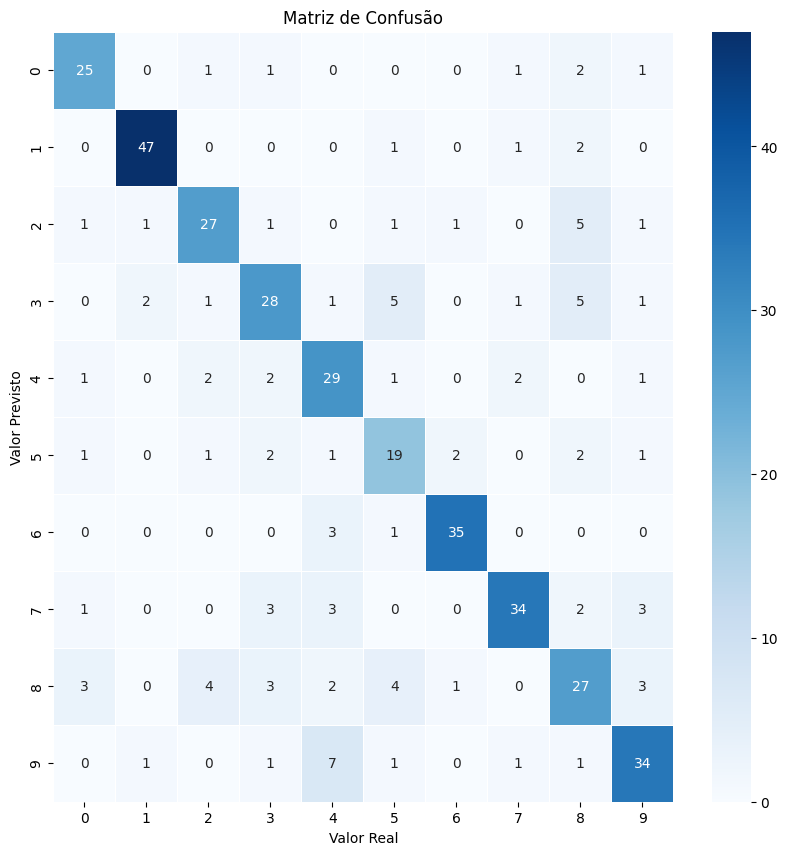


Macro f1: 0.7065400856135075

Accuracy: 0.7163814180929096



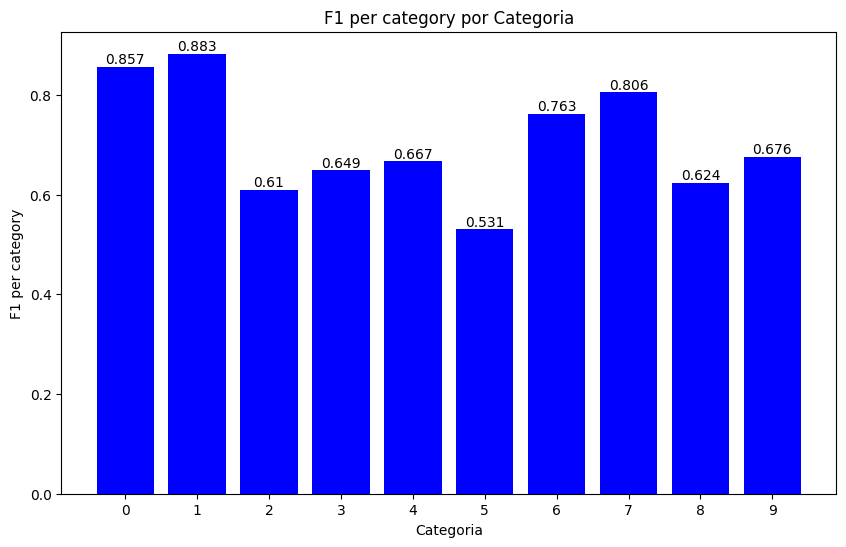

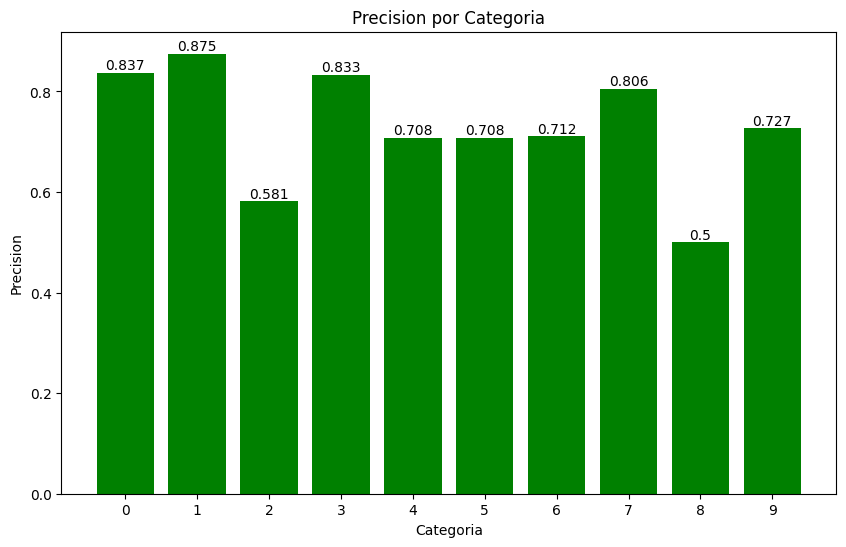

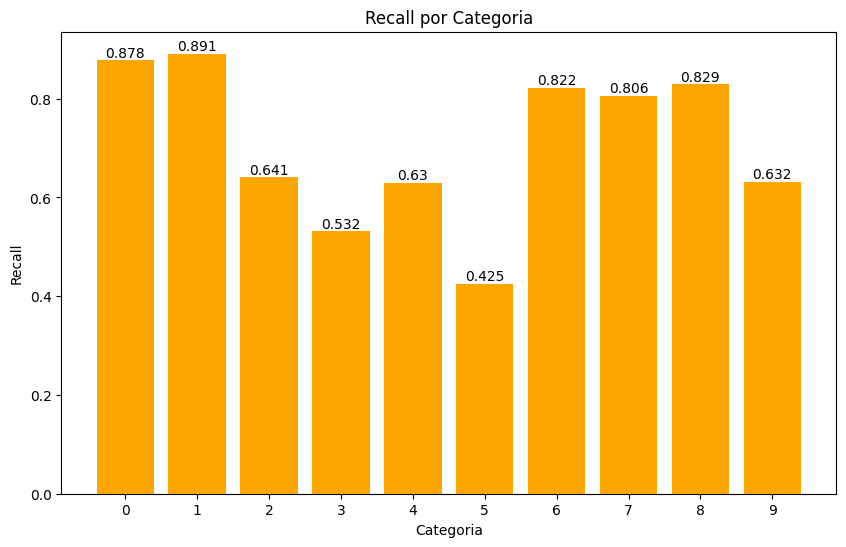

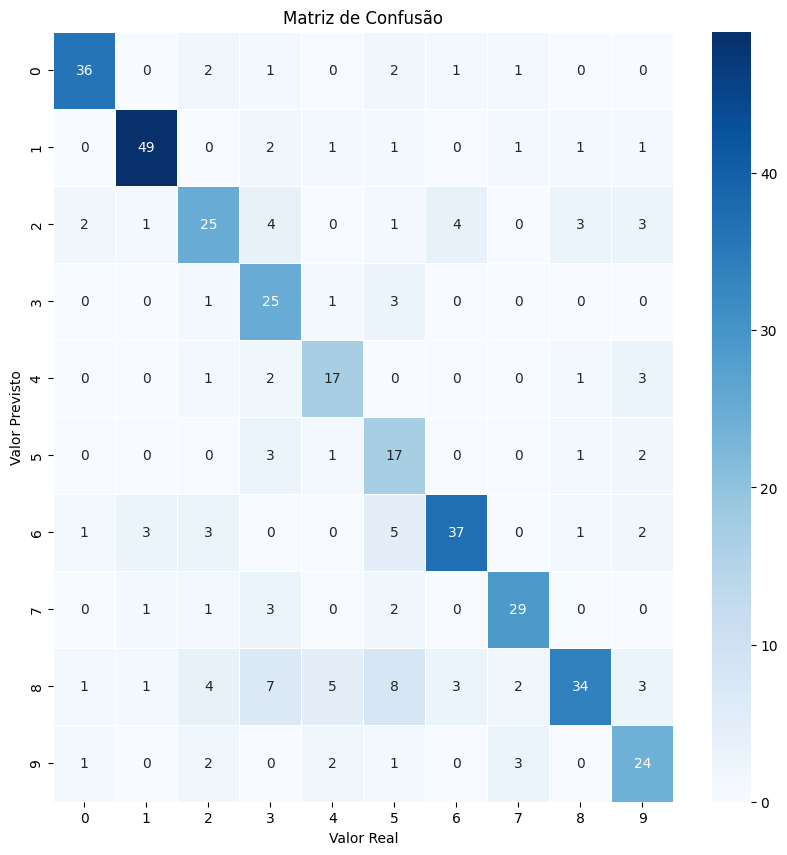


Macro f1: 0.6843413617929777

Accuracy: 0.6973365617433414



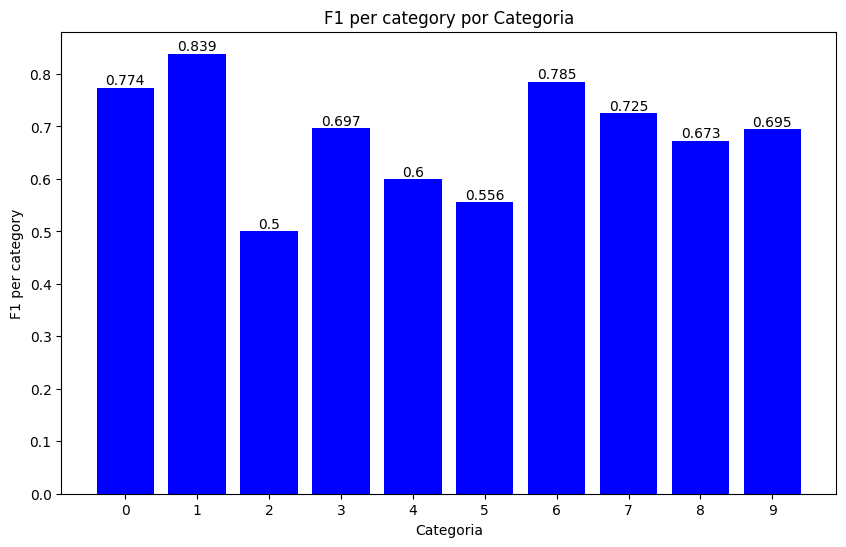

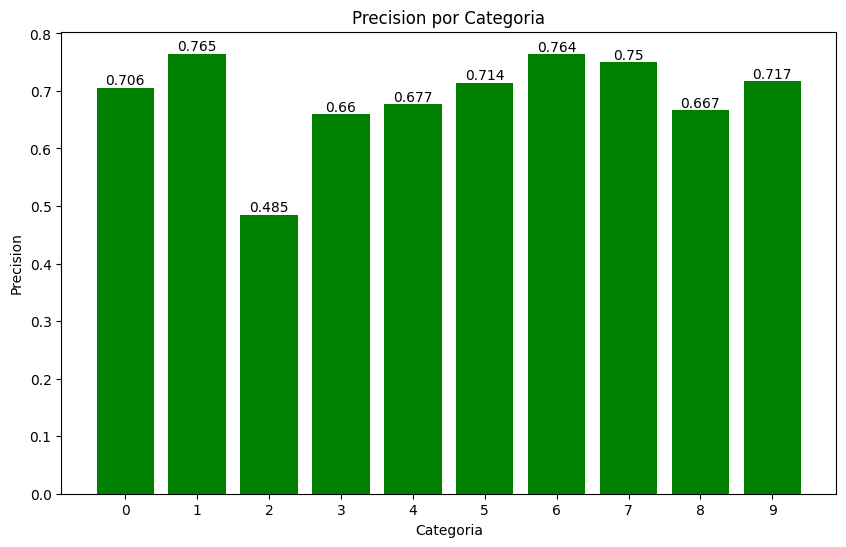

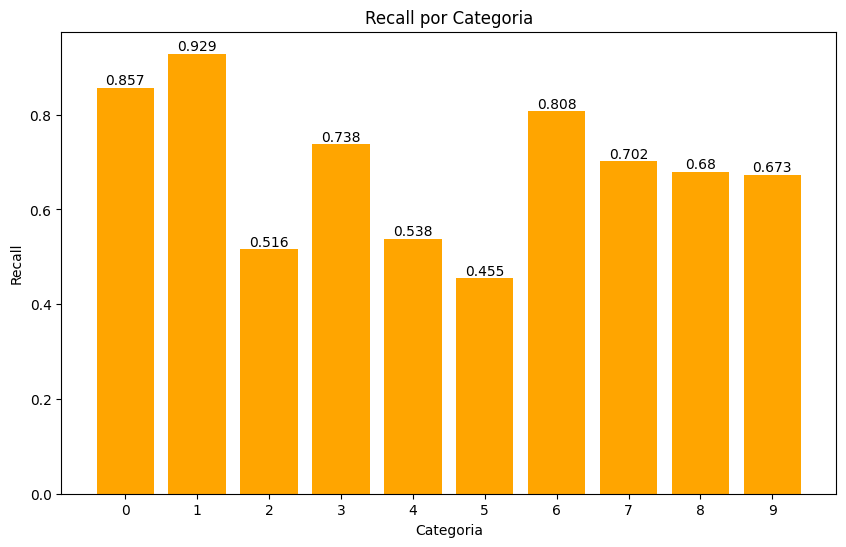

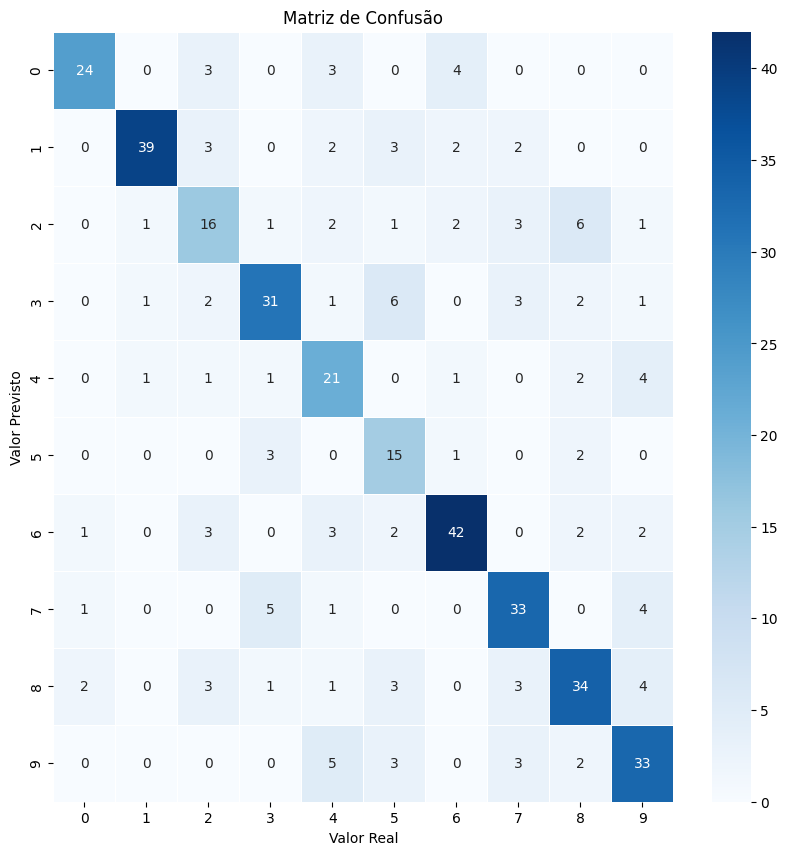

In [6]:
show_results("Random Forest 28x28", numbers, exp)

## Use infogain as input filter (3RD step)

In [7]:
file_name = 'mnist_sample_feature_select.csv'

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

# generate fold and p experiment
folds = Fold.generate_k_folds(df_data,val_k=5,col_category='y_class',
                            num_threshold=1,seed=1,
                            num_folds_validation=3,num_threshold_validation=2)

### Random Forest Classifier 20x20

In [8]:
clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnMachineLearning(clf_rf)
exp = Experiment(folds,ml_method, GoalOptimizationRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calculate_results()

[I 2023-11-30 12:33:04,674] A new study created in memory with name: no-name-ac59b2a5-b672-49ac-a90c-b961cf825d4f
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:111: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:112: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/results.py:70: UndefinedMetricWarning: There is no predicted elements for this category 0 precisio set as zero.
  warnings.warn("There is no predicted elements for this category "+str(category)+" prec

In [9]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_trees,state
3,3,0.742575,2023-11-30 12:33:04.951625,2023-11-30 12:33:05.494127,0 days 00:00:00.542502,0.163638,0.006228,5,COMPLETE
6,6,0.719585,2023-11-30 12:33:05.823880,2023-11-30 12:33:06.219832,0 days 00:00:00.395952,0.219455,0.014733,4,COMPLETE
4,4,0.659417,2023-11-30 12:33:05.495346,2023-11-30 12:33:05.584927,0 days 00:00:00.089581,0.008135,0.019708,5,COMPLETE
2,2,0.482528,2023-11-30 12:33:04.828118,2023-11-30 12:33:04.950879,0 days 00:00:00.122761,0.172780,0.093130,2,COMPLETE
9,9,0.339053,2023-11-30 12:33:06.439998,2023-11-30 12:33:06.549264,0 days 00:00:00.109266,0.163679,0.235499,3,COMPLETE
5,5,0.270559,2023-11-30 12:33:05.585653,2023-11-30 12:33:05.823212,0 days 00:00:00.237559,0.496695,0.388678,5,COMPLETE
1,1,0.251799,2023-11-30 12:33:04.774347,2023-11-30 12:33:04.827271,0 days 00:00:00.052924,0.073378,0.151166,1,COMPLETE
7,7,0.220920,2023-11-30 12:33:06.220610,2023-11-30 12:33:06.308609,0 days 00:00:00.087999,0.111096,0.315703,3,COMPLETE
0,0,0.201741,2023-11-30 12:33:04.675482,2023-11-30 12:33:04.773446,0 days 00:00:00.097964,0.360162,0.208511,1,COMPLETE
8,8,0.192687,2023-11-30 12:33:06.309486,2023-11-30 12:33:06.439292,0 days 00:00:00.129806,0.302326,0.481135,4,COMPLETE


In [10]:
parameters_graph(exp.studies_per_fold[0].trials)

<IPython.core.display.Javascript object>

Random Forest 20x20
Macro f1: 0.7633773452506818

Accuracy: 0.7652811735941321



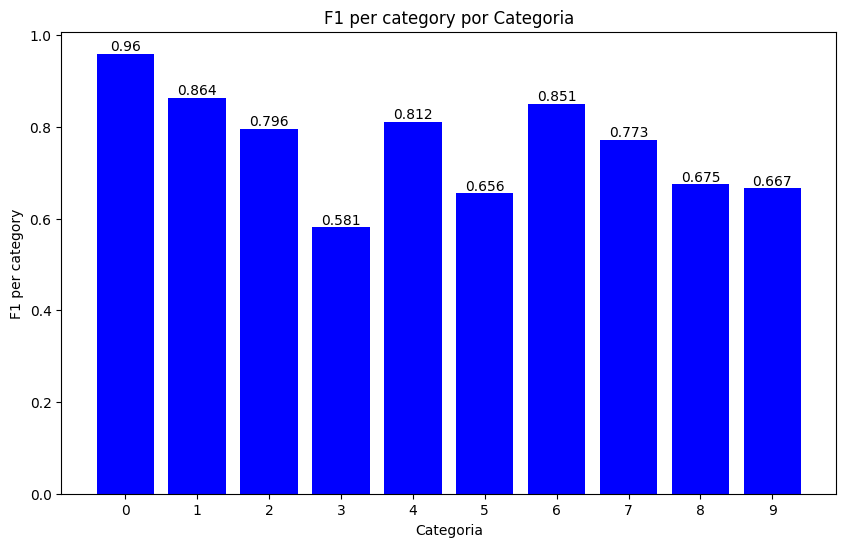

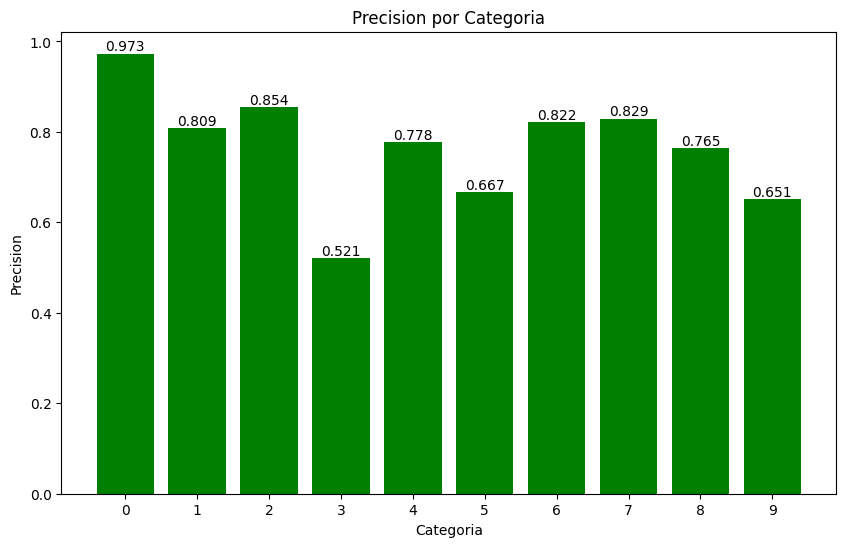

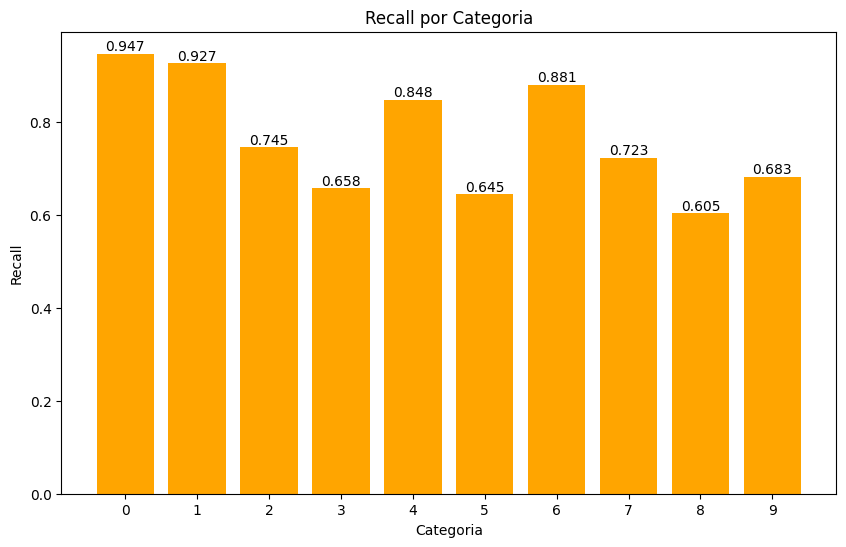

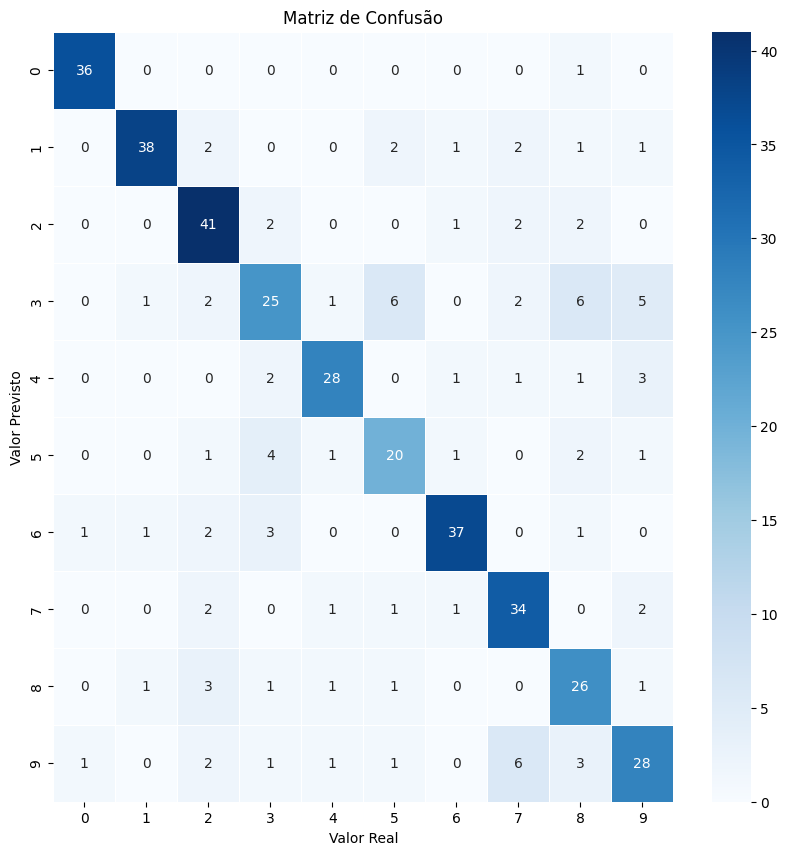


Macro f1: 0.7865870053455075

Accuracy: 0.7921760391198044



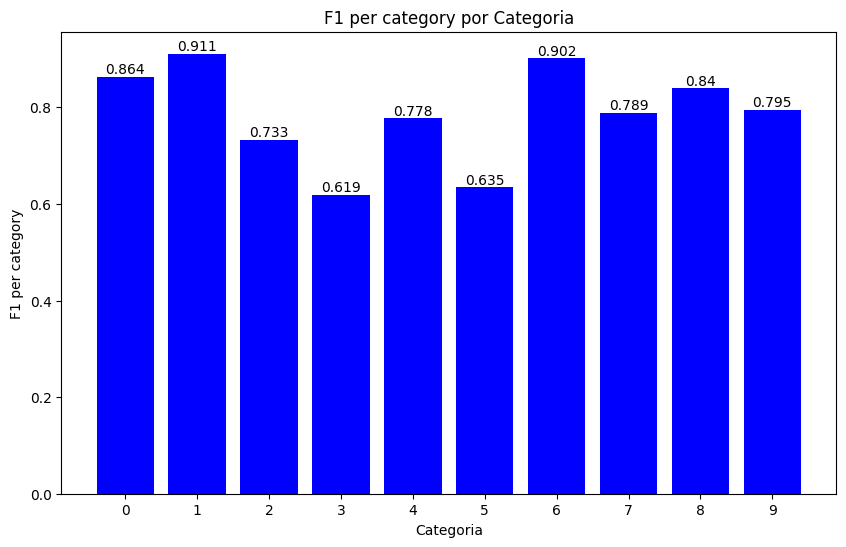

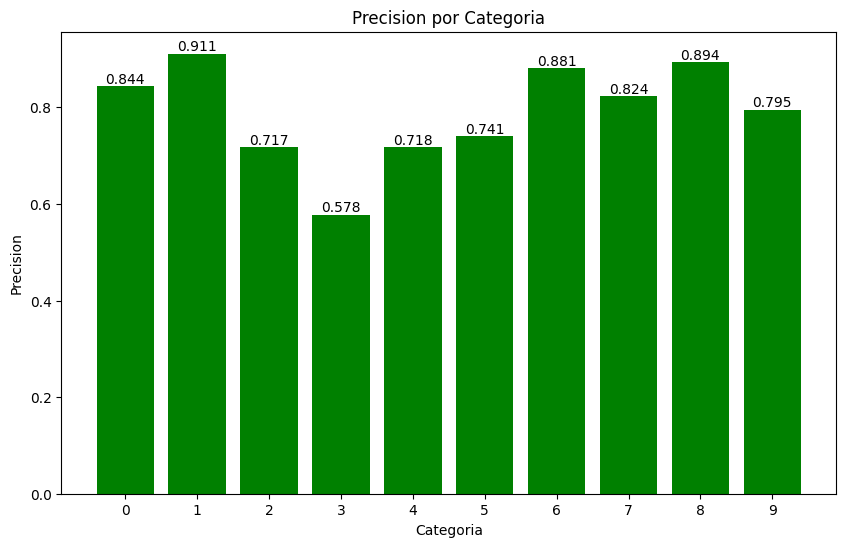

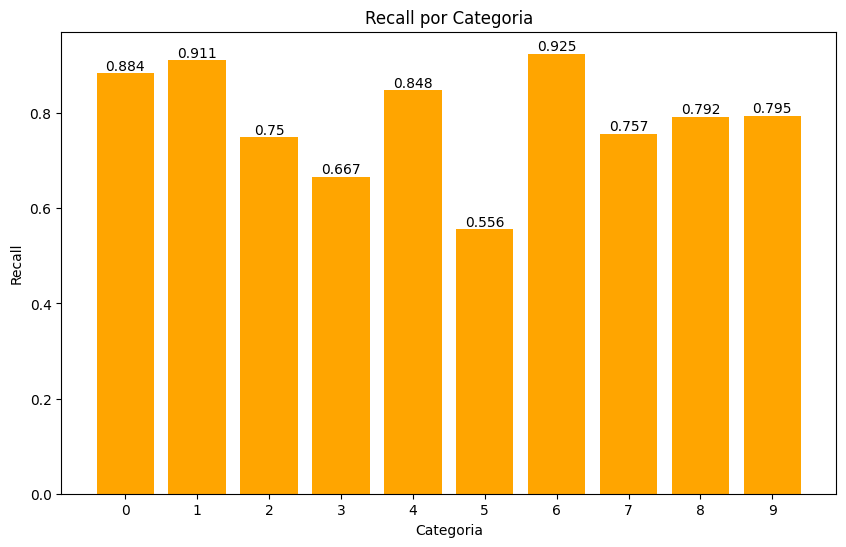

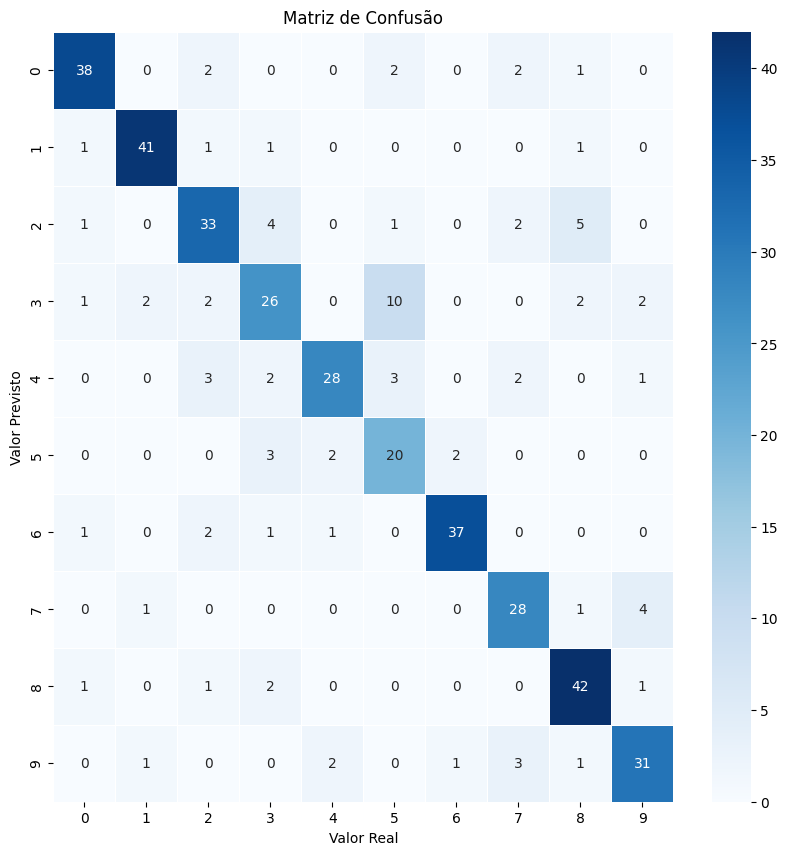


Macro f1: 0.8040733050018096

Accuracy: 0.8068459657701712



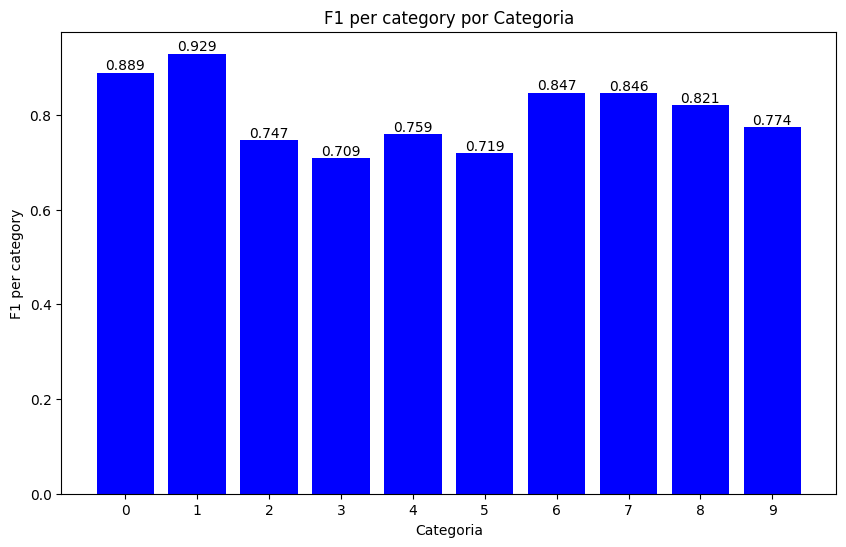

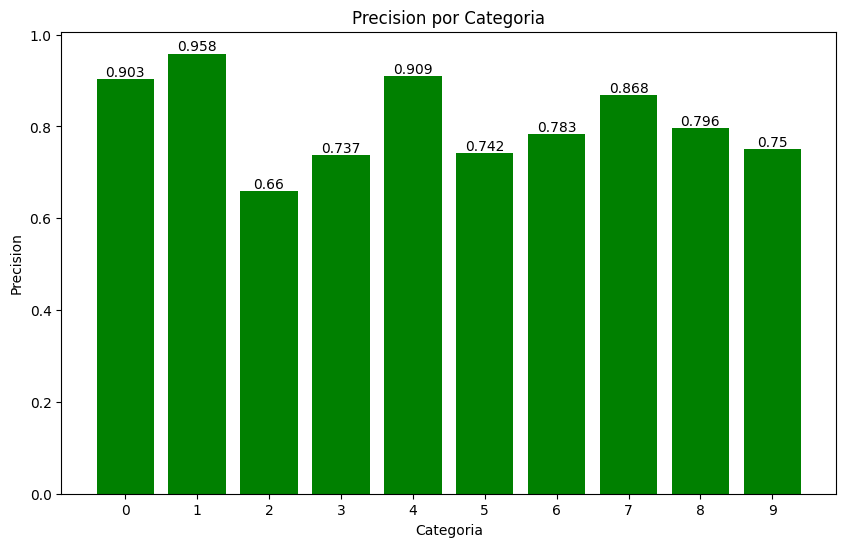

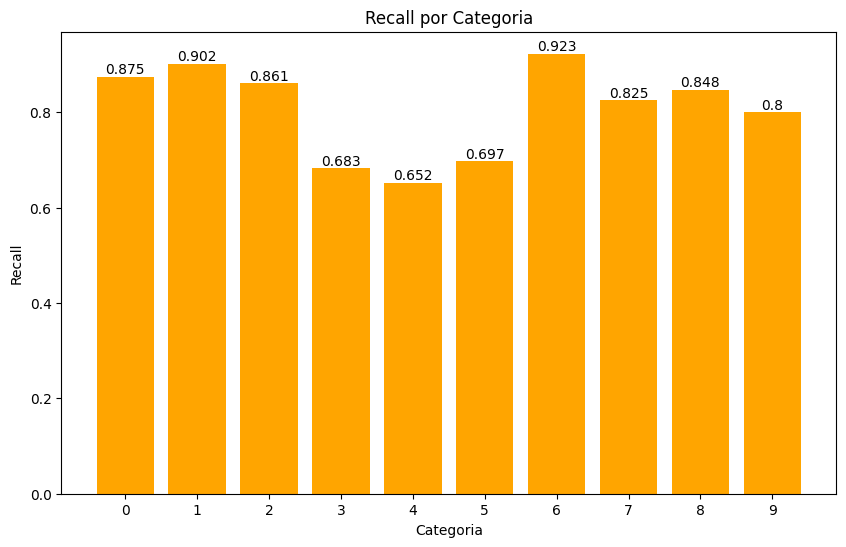

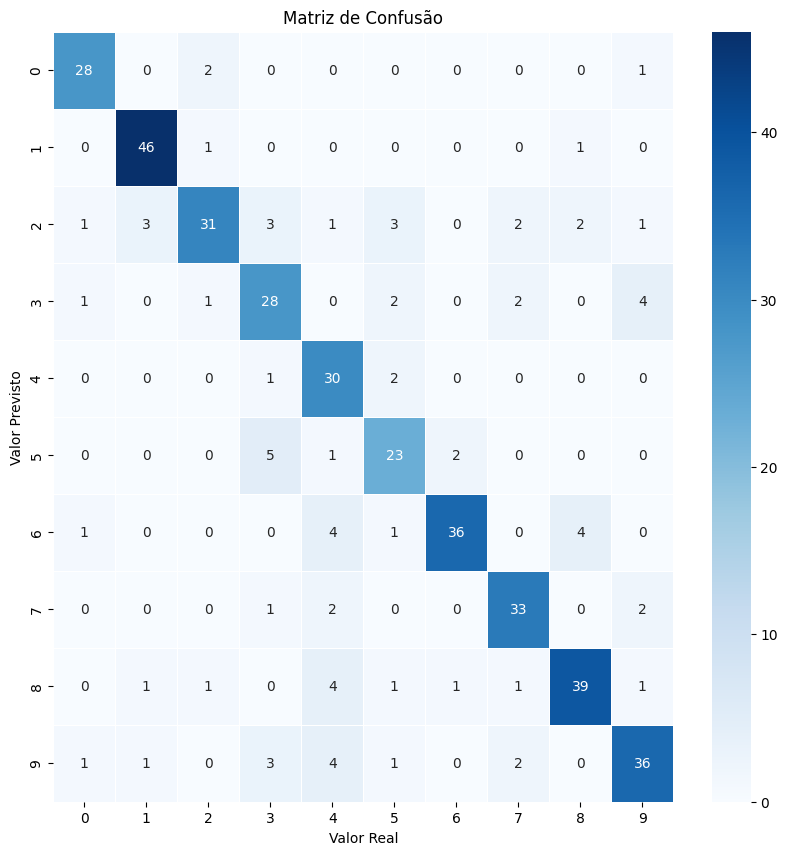


Macro f1: 0.737318608886971

Accuracy: 0.7506112469437652



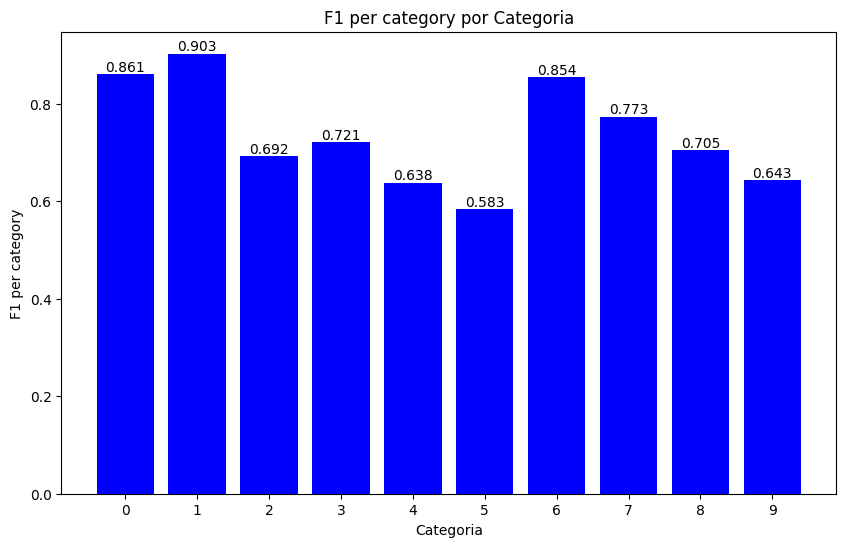

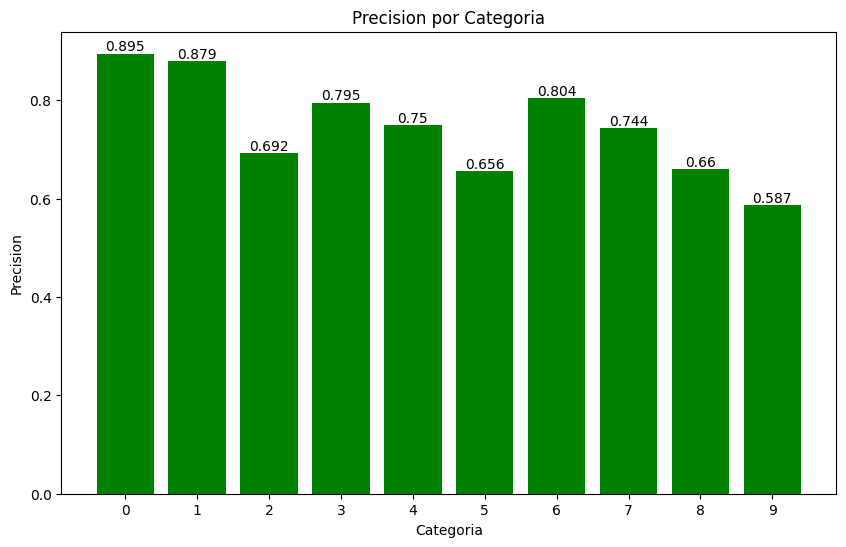

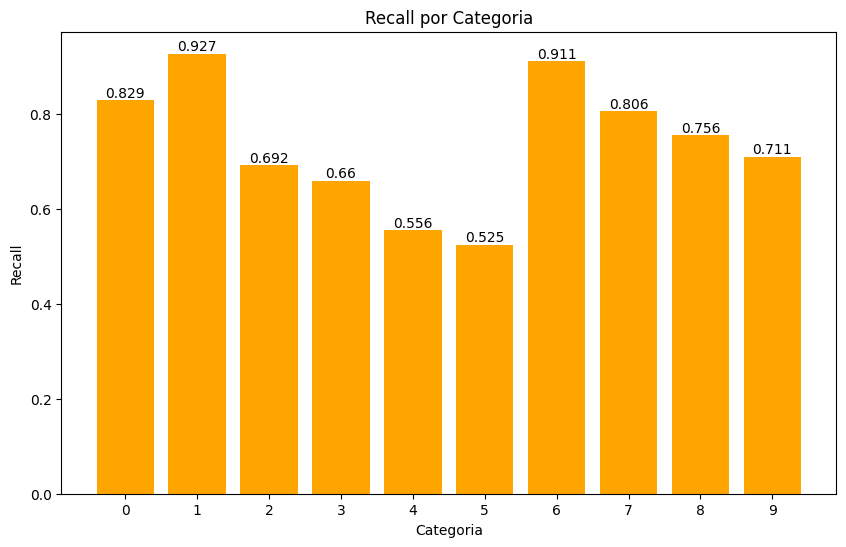

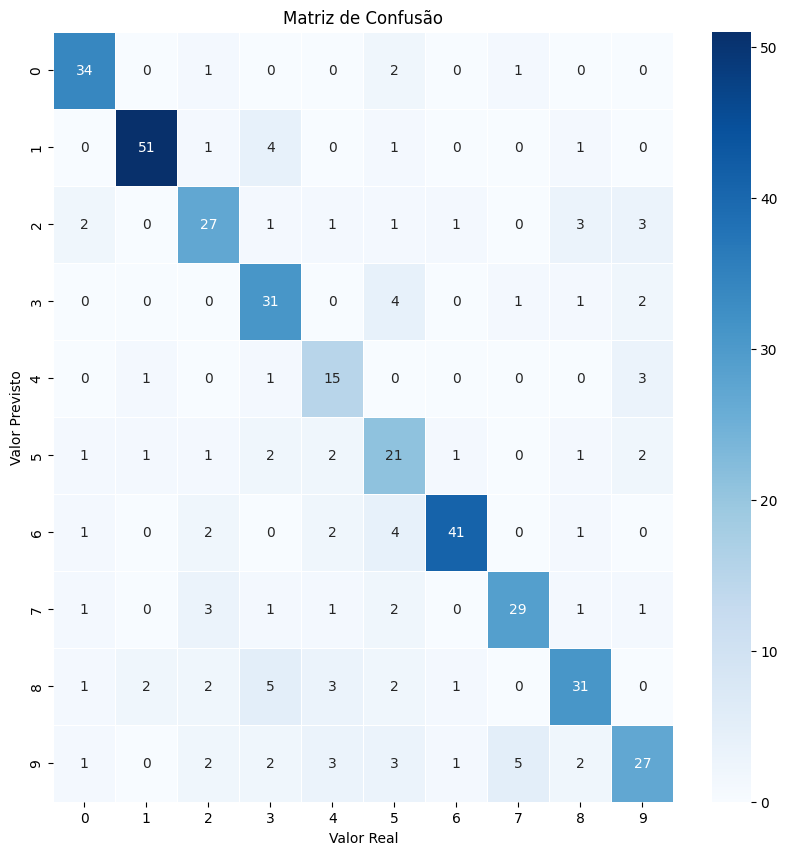


Macro f1: 0.6800687189588108

Accuracy: 0.6876513317191283



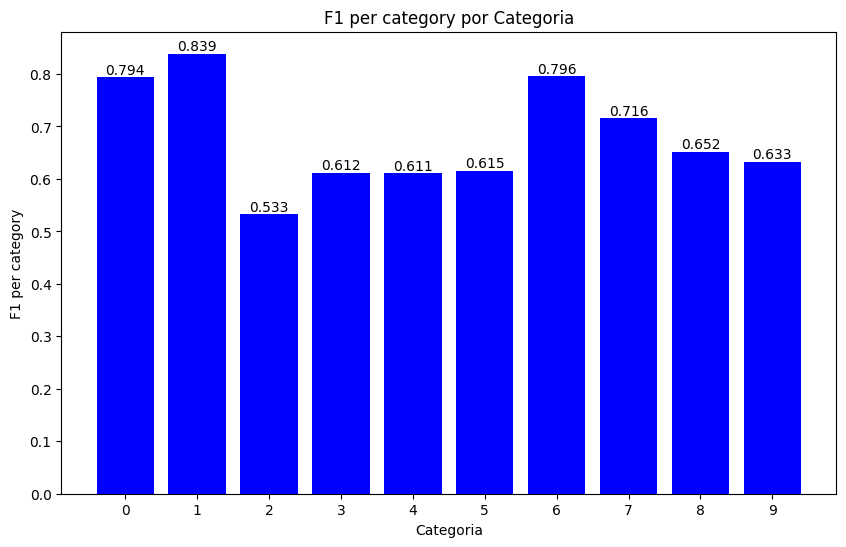

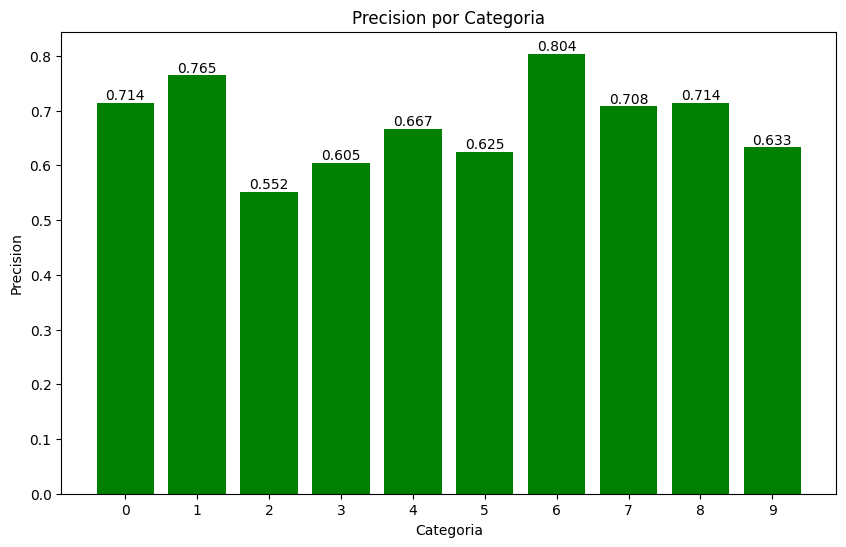

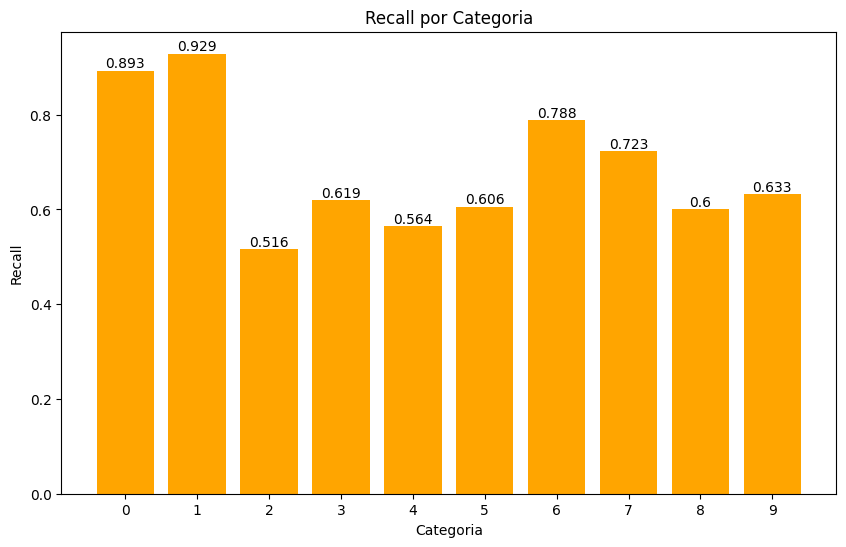

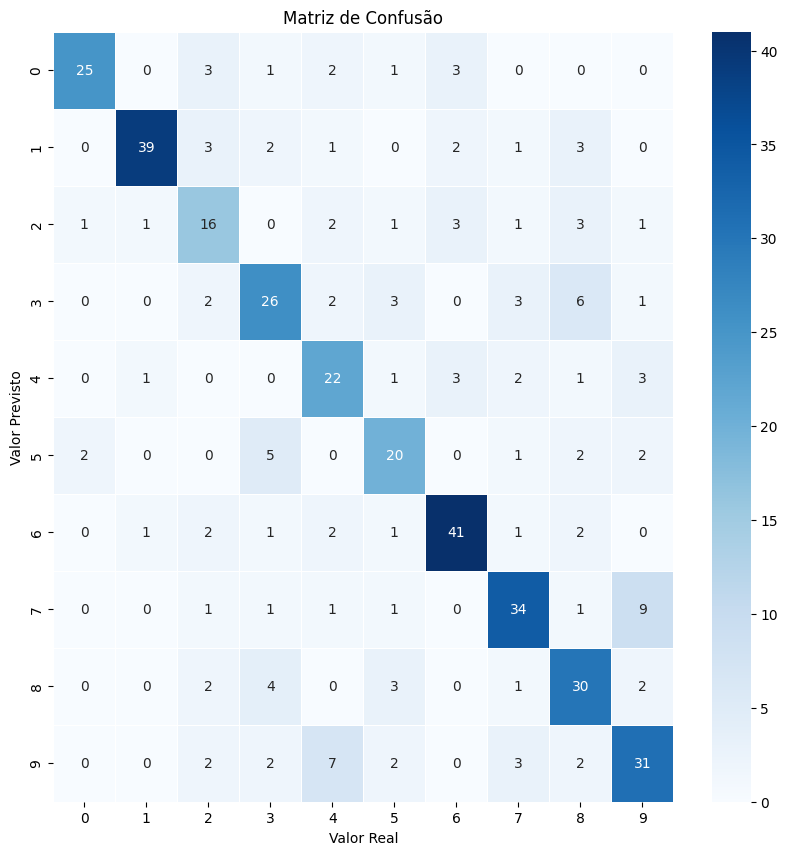

In [11]:
show_results("Random Forest 20x20", numbers, exp)

## Transform feature as input filter (4TH step)

In [12]:
file_name = 'mnist_sample_binary.csv'

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

# generate fold and p experiment
folds = Fold.generate_k_folds(df_data,val_k=5,col_category='y_class',
                            num_threshold=1,seed=1,
                            num_folds_validation=3,num_threshold_validation=2)

### Random Forest Classifier 28x28 Binary Input

In [13]:
clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnMachineLearning(clf_rf)
exp = Experiment(folds,ml_method, GoalOptimizationRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calculate_results()

[I 2023-11-30 12:33:17,329] A new study created in memory with name: no-name-1e3b2ba7-cc2b-4c3f-a014-03d08df56802
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:111: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:112: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/results.py:70: UndefinedMetricWarning: There is no predicted elements for this category 0 precisio set as zero.
  warnings.warn("There is no predicted elements for this category "+str(category)+" prec

In [14]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_trees,state
3,3,0.779143,2023-11-30 12:33:17.597046,2023-11-30 12:33:17.828727,0 days 00:00:00.231681,0.163638,0.006228,5,COMPLETE
6,6,0.755129,2023-11-30 12:33:18.087018,2023-11-30 12:33:18.302473,0 days 00:00:00.215455,0.219455,0.014733,4,COMPLETE
4,4,0.684416,2023-11-30 12:33:17.829641,2023-11-30 12:33:17.935258,0 days 00:00:00.105617,0.008135,0.019708,5,COMPLETE
2,2,0.503766,2023-11-30 12:33:17.496617,2023-11-30 12:33:17.596063,0 days 00:00:00.099446,0.172780,0.093130,2,COMPLETE
9,9,0.323370,2023-11-30 12:33:18.509958,2023-11-30 12:33:18.613023,0 days 00:00:00.103065,0.163679,0.235499,3,COMPLETE
7,7,0.312803,2023-11-30 12:33:18.303544,2023-11-30 12:33:18.399214,0 days 00:00:00.095670,0.111096,0.315703,3,COMPLETE
5,5,0.301928,2023-11-30 12:33:17.936177,2023-11-30 12:33:18.086296,0 days 00:00:00.150119,0.496695,0.388678,5,COMPLETE
1,1,0.267890,2023-11-30 12:33:17.428954,2023-11-30 12:33:17.495420,0 days 00:00:00.066466,0.073378,0.151166,1,COMPLETE
8,8,0.232217,2023-11-30 12:33:18.400010,2023-11-30 12:33:18.509164,0 days 00:00:00.109154,0.302326,0.481135,4,COMPLETE
0,0,0.209156,2023-11-30 12:33:17.330606,2023-11-30 12:33:17.427924,0 days 00:00:00.097318,0.360162,0.208511,1,COMPLETE


In [15]:
parameters_graph(exp.studies_per_fold[0].trials)

<IPython.core.display.Javascript object>

Random Forest 28x28 Binary Input
Macro f1: 0.7274842534245659

Accuracy: 0.7310513447432763



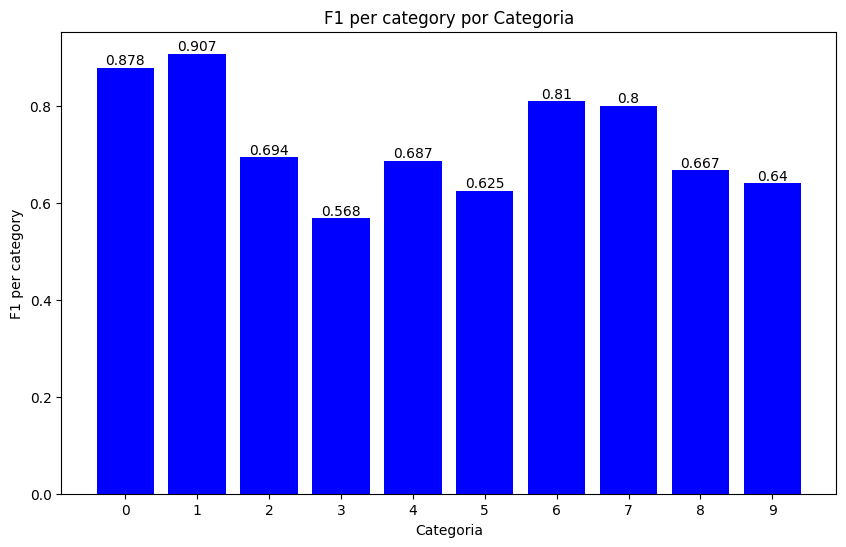

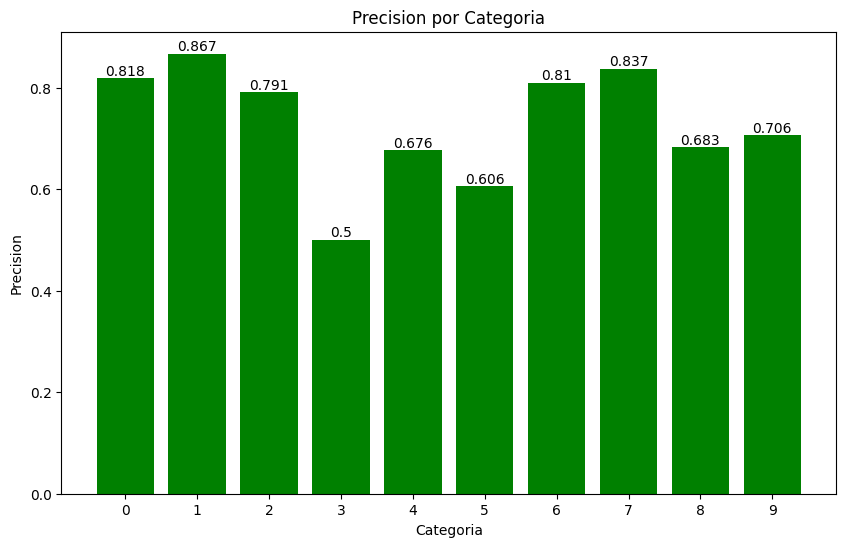

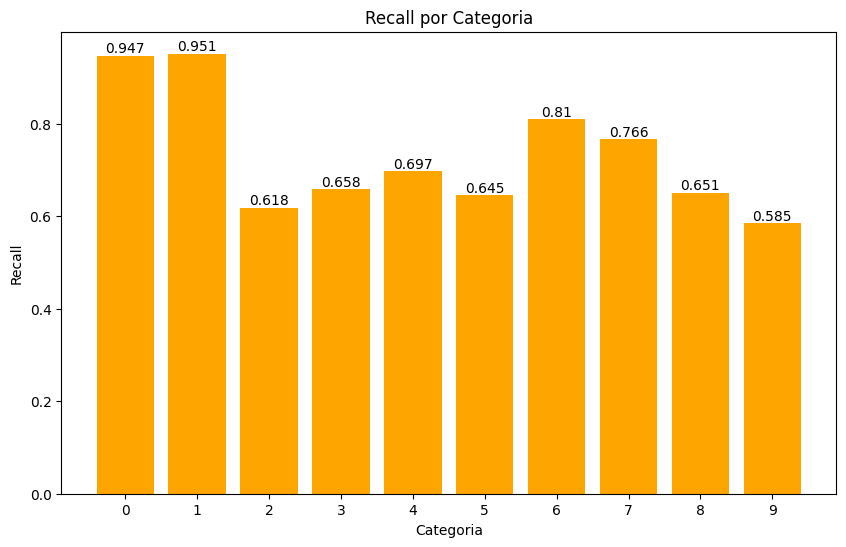

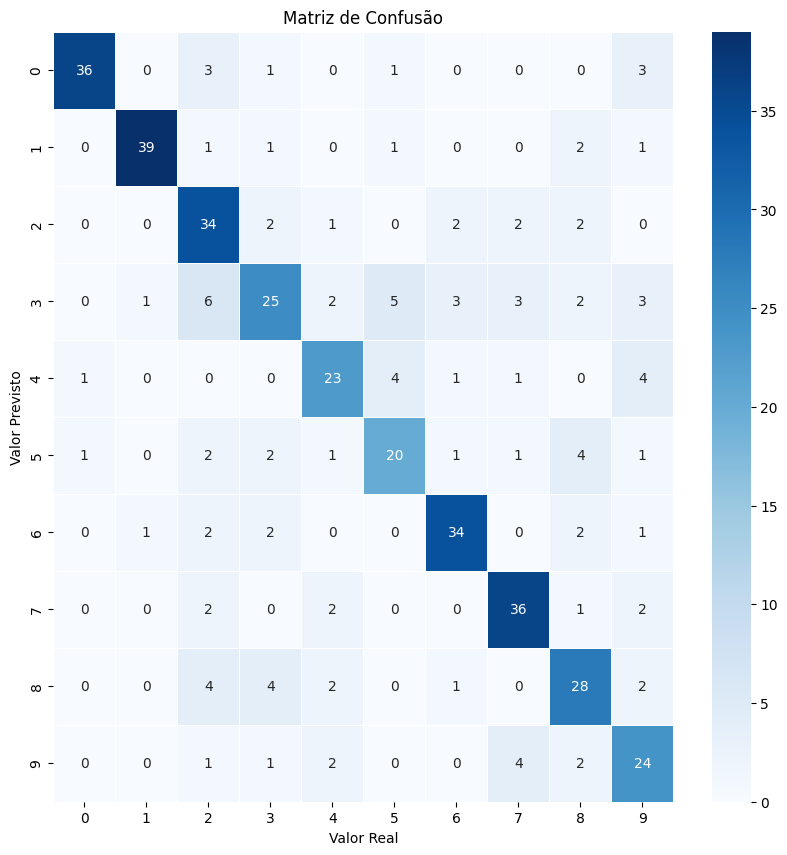


Macro f1: 0.7808922196817586

Accuracy: 0.78239608801956



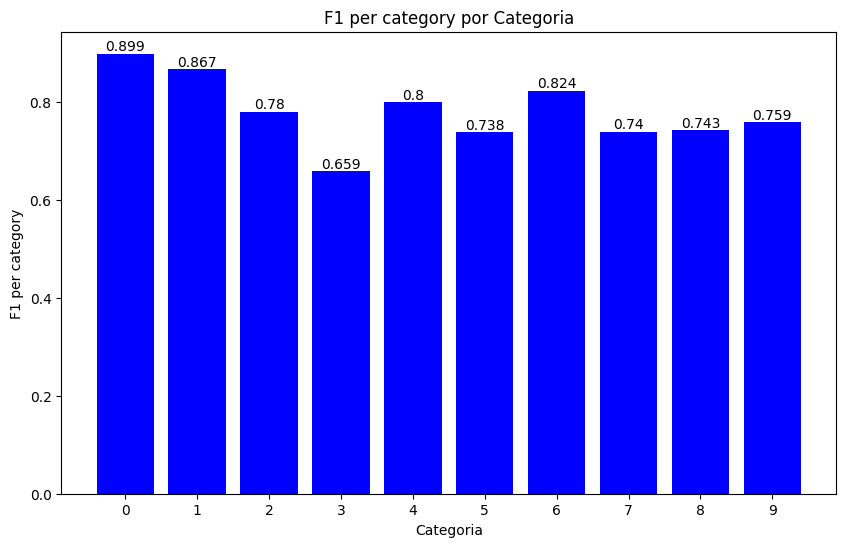

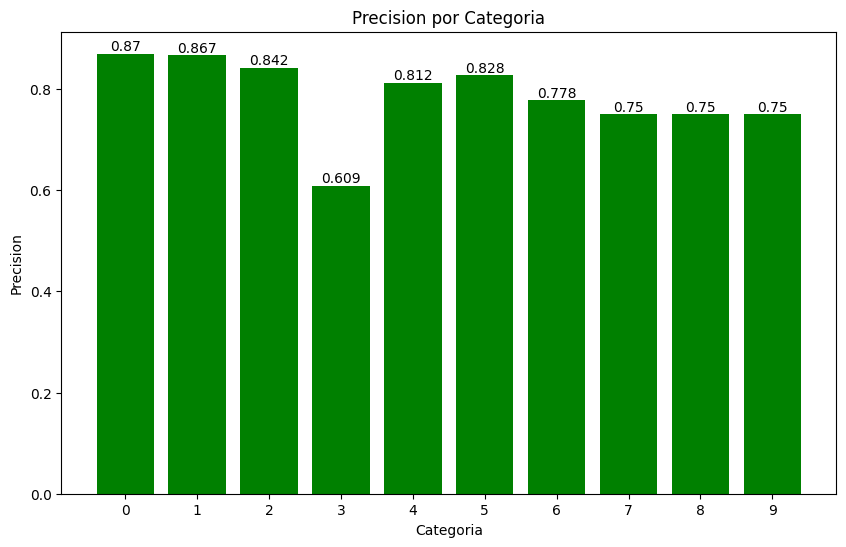

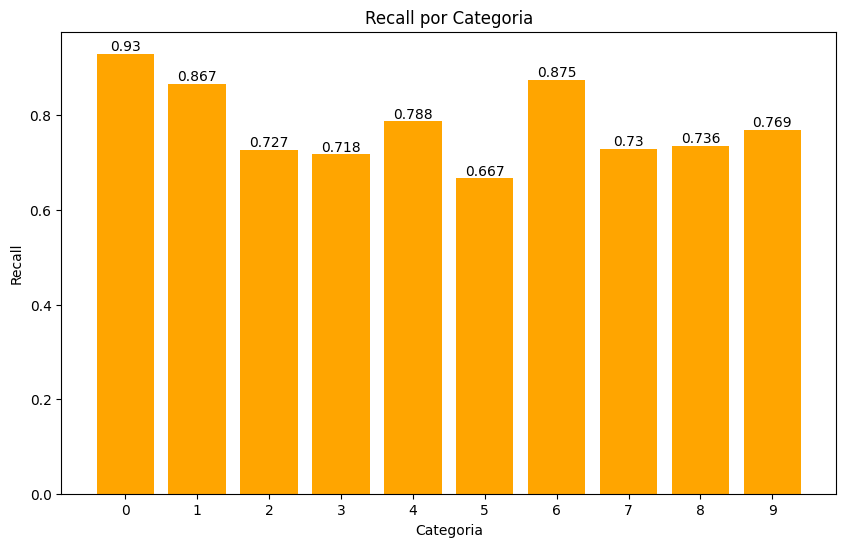

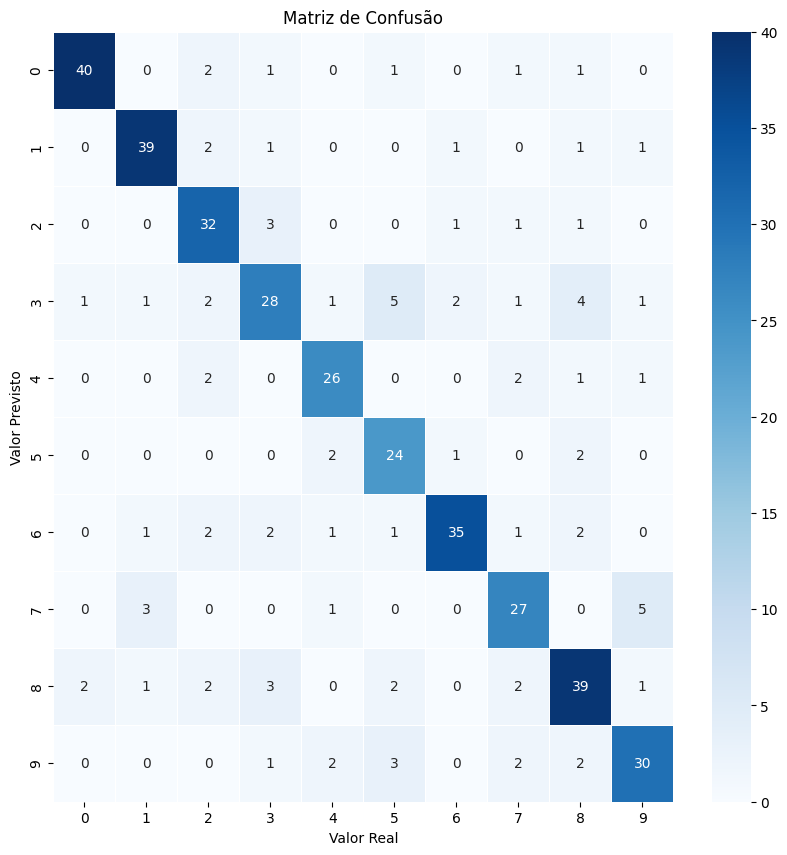


Macro f1: 0.7488522083046976

Accuracy: 0.7555012224938875



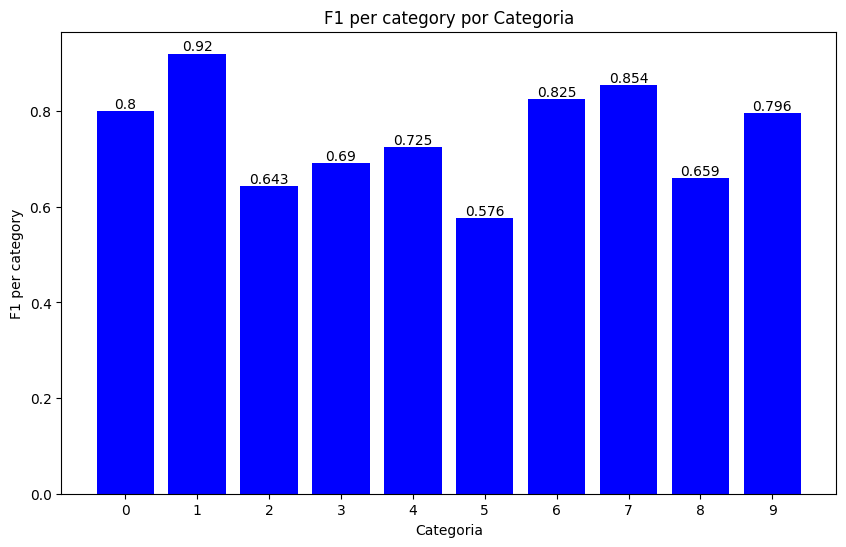

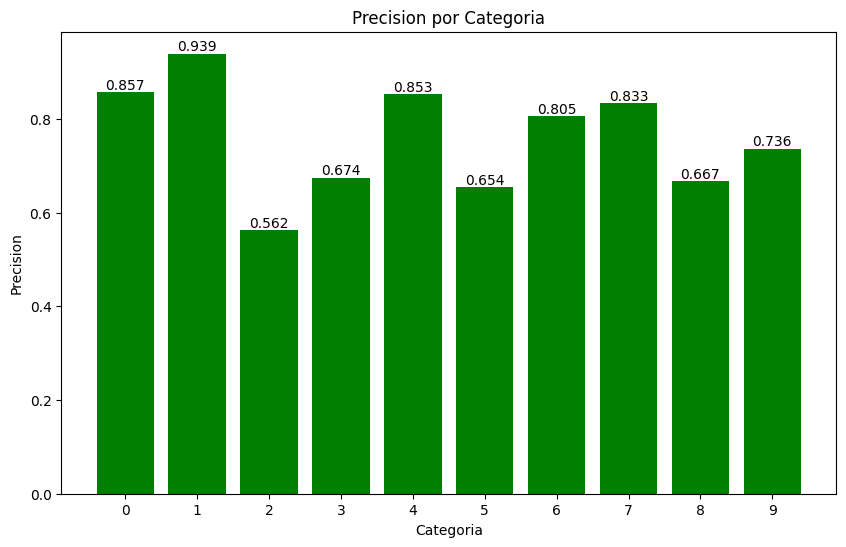

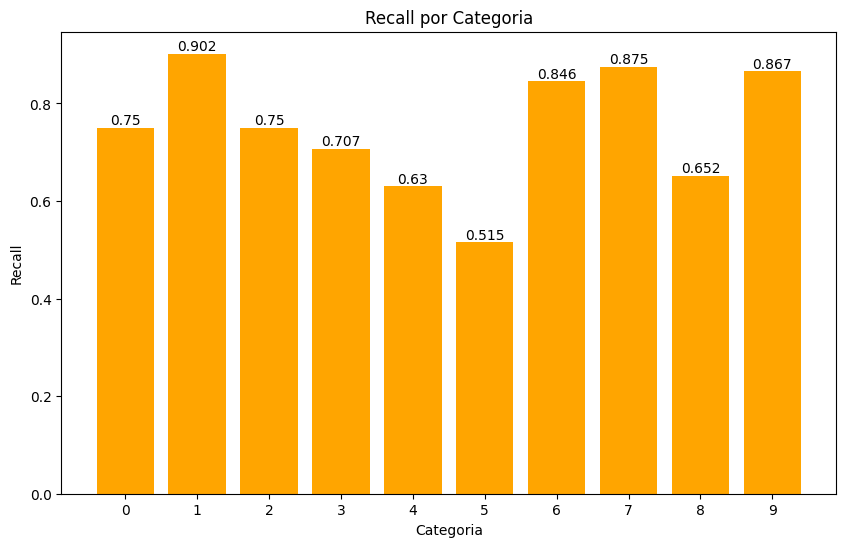

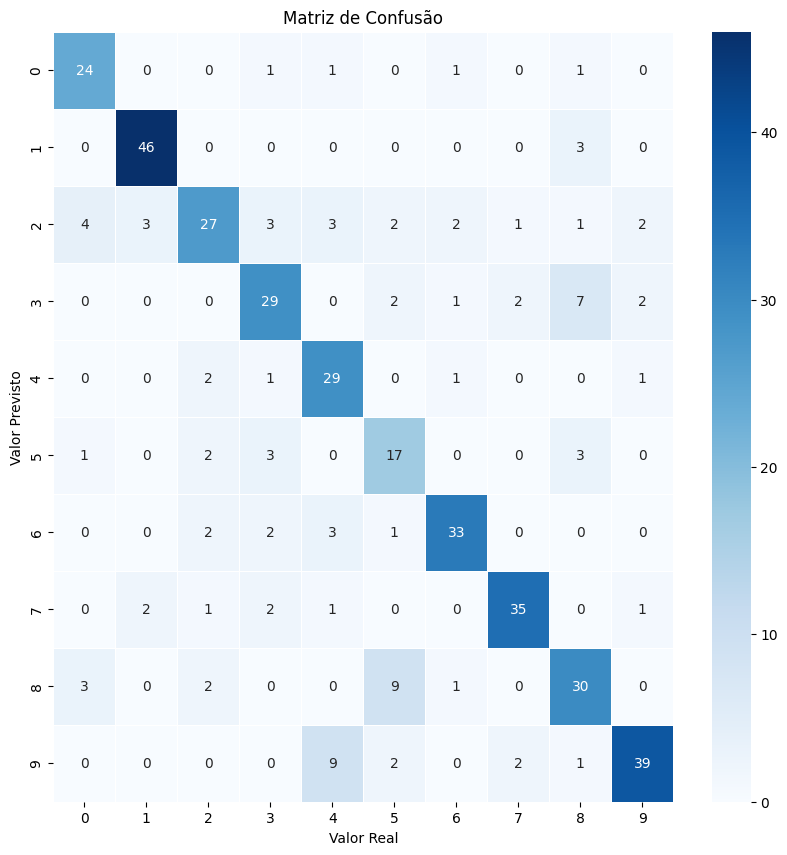


Macro f1: 0.7893716363845268

Accuracy: 0.7970660146699267



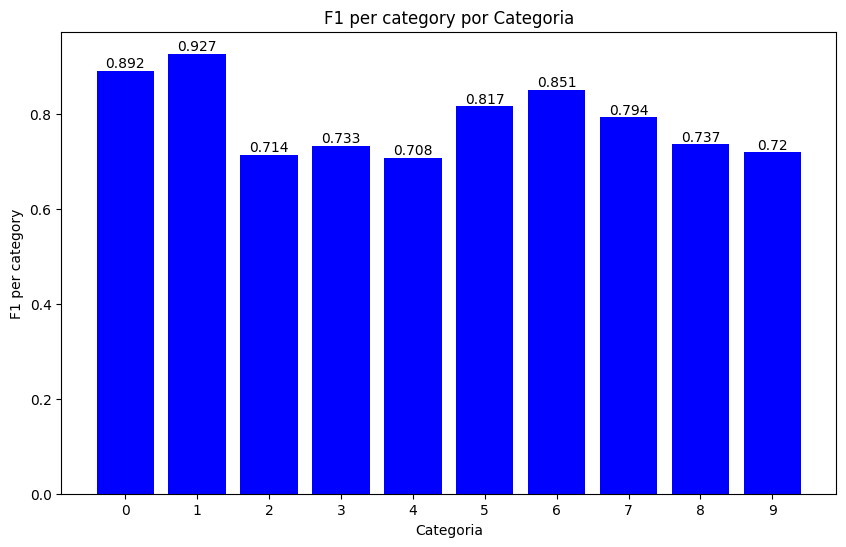

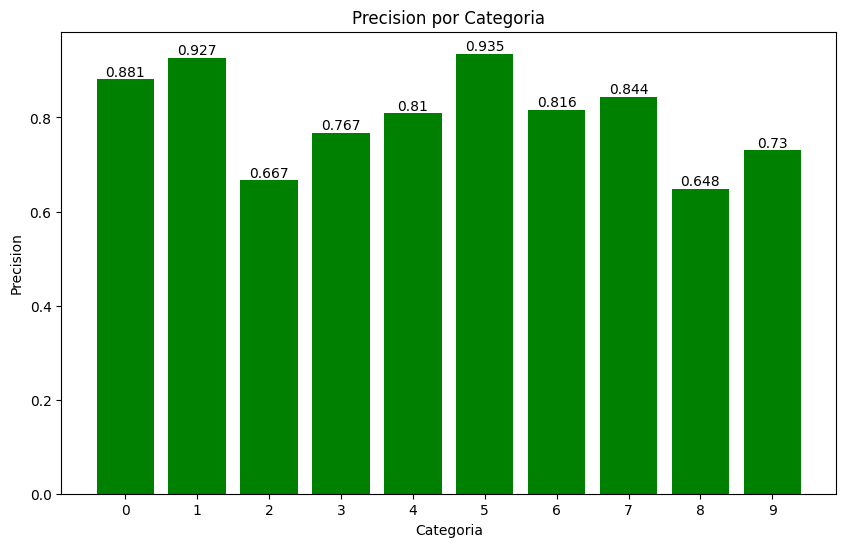

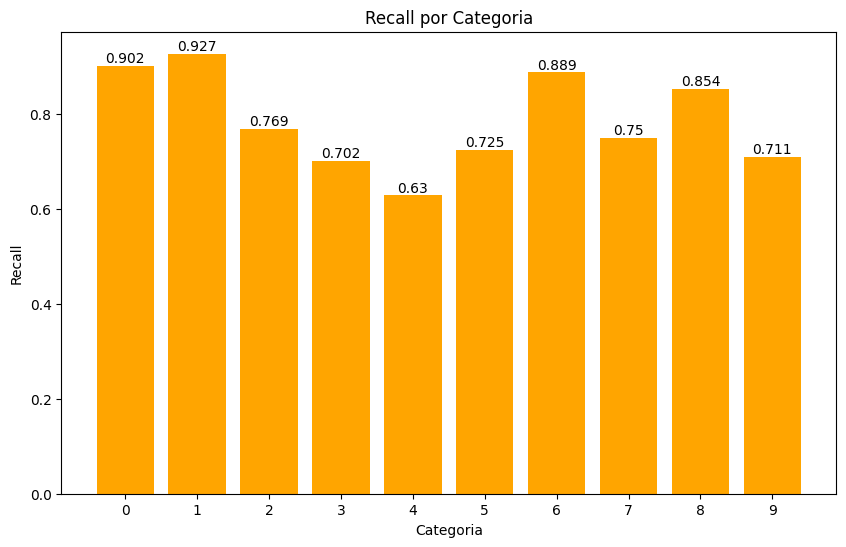

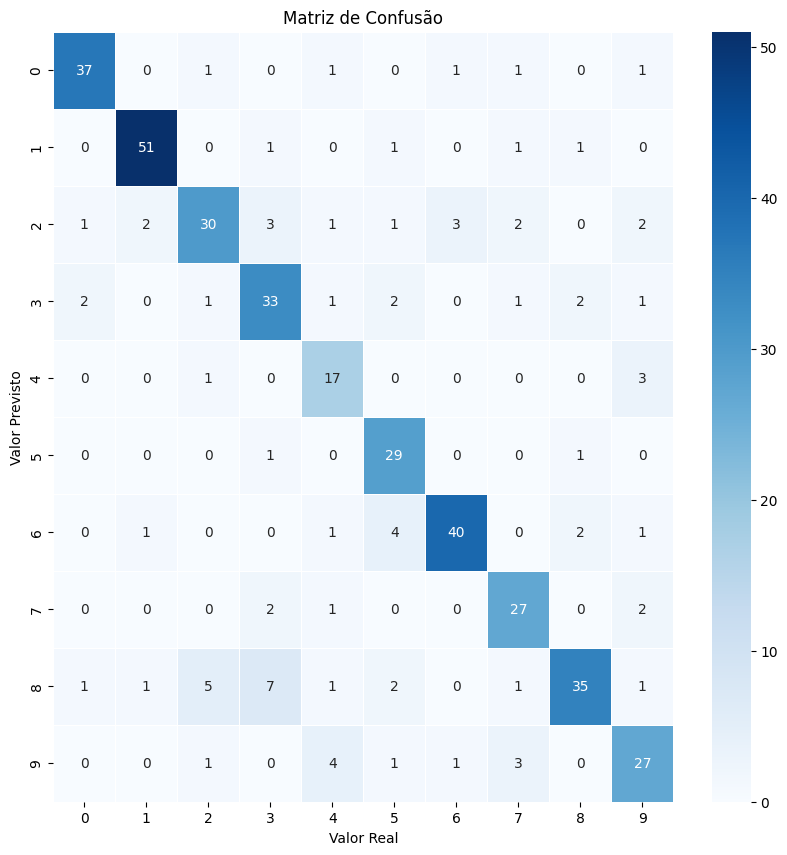


Macro f1: 0.7574073264921956

Accuracy: 0.7627118644067796



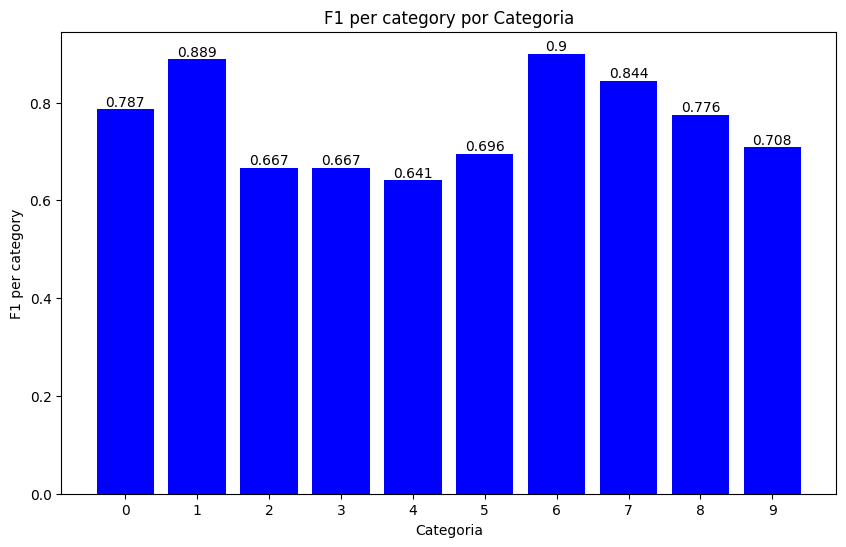

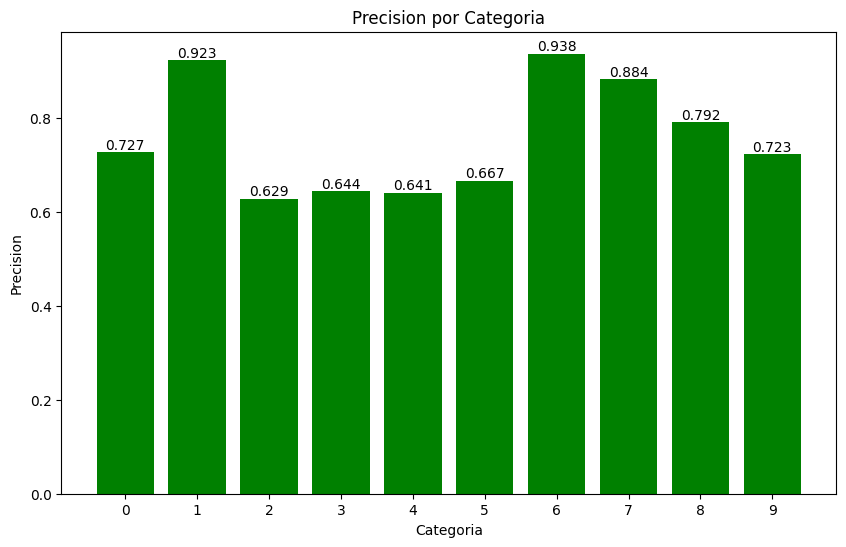

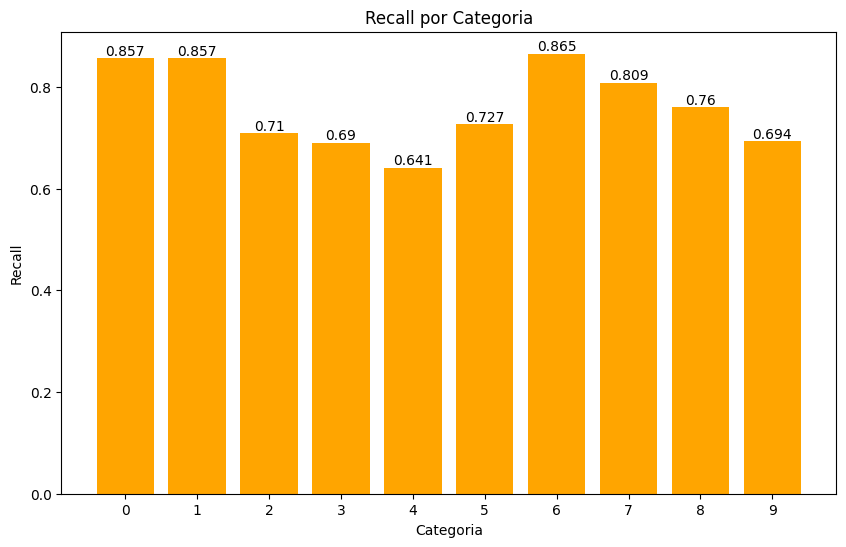

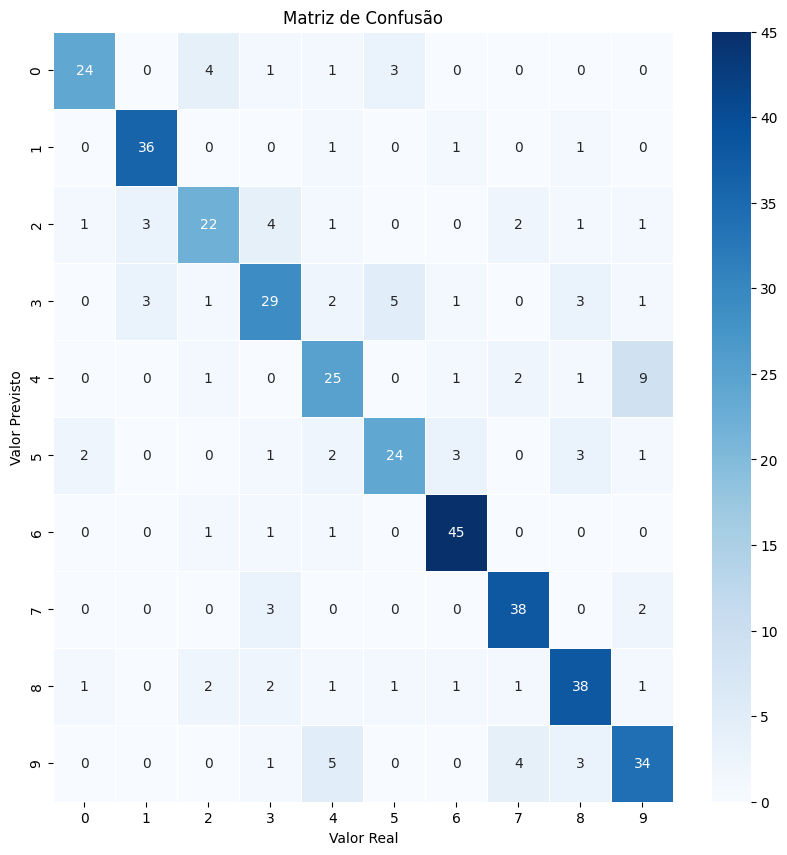

In [16]:
show_results("Random Forest 28x28 Binary Input", numbers, exp)

## Mix input filters (5TH step)

In [17]:
file_name = 'mnist_sample_feature_select_binary.csv'

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

# generate fold and p experiment
folds = Fold.generate_k_folds(df_data,val_k=5,col_category='y_class',
                            num_threshold=1,seed=1,
                            num_folds_validation=3,num_threshold_validation=2)

### Random Forest Classifier 20x20 Binary Input

In [18]:
clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnMachineLearning(clf_rf)
exp = Experiment(folds,ml_method, GoalOptimizationRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calculate_results()

[I 2023-11-30 12:33:27,310] A new study created in memory with name: no-name-6960c6a8-a11f-45cb-933e-5e0176c6f0f5
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:111: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/evaluation.py:112: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
/home/gabriel/Code/optical-caracter-recognition/results.py:70: UndefinedMetricWarning: There is no predicted elements for this category 0 precisio set as zero.
  warnings.warn("There is no predicted elements for this category "+str(category)+" prec

In [19]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_trees,state
3,3,0.777533,2023-11-30 12:33:27.480380,2023-11-30 12:33:27.633951,0 days 00:00:00.153571,0.163638,0.006228,5,COMPLETE
6,6,0.743545,2023-11-30 12:33:27.818107,2023-11-30 12:33:27.952219,0 days 00:00:00.134112,0.219455,0.014733,4,COMPLETE
4,4,0.679633,2023-11-30 12:33:27.635268,2023-11-30 12:33:27.714681,0 days 00:00:00.079413,0.008135,0.019708,5,COMPLETE
2,2,0.513861,2023-11-30 12:33:27.417042,2023-11-30 12:33:27.479498,0 days 00:00:00.062456,0.172780,0.093130,2,COMPLETE
9,9,0.300667,2023-11-30 12:33:28.099453,2023-11-30 12:33:28.170200,0 days 00:00:00.070747,0.163679,0.235499,3,COMPLETE
5,5,0.280705,2023-11-30 12:33:27.715466,2023-11-30 12:33:27.817311,0 days 00:00:00.101845,0.496695,0.388678,5,COMPLETE
1,1,0.250844,2023-11-30 12:33:27.371168,2023-11-30 12:33:27.416235,0 days 00:00:00.045067,0.073378,0.151166,1,COMPLETE
7,7,0.209918,2023-11-30 12:33:27.953036,2023-11-30 12:33:28.019726,0 days 00:00:00.066690,0.111096,0.315703,3,COMPLETE
0,0,0.181320,2023-11-30 12:33:27.311272,2023-11-30 12:33:27.370457,0 days 00:00:00.059185,0.360162,0.208511,1,COMPLETE
8,8,0.167070,2023-11-30 12:33:28.020521,2023-11-30 12:33:28.098632,0 days 00:00:00.078111,0.302326,0.481135,4,COMPLETE


In [20]:
parameters_graph(exp.studies_per_fold[0].trials)

<IPython.core.display.Javascript object>

Random Forest 20x20 Binary Input
Macro f1: 0.7688633082058539

Accuracy: 0.7701711491442543



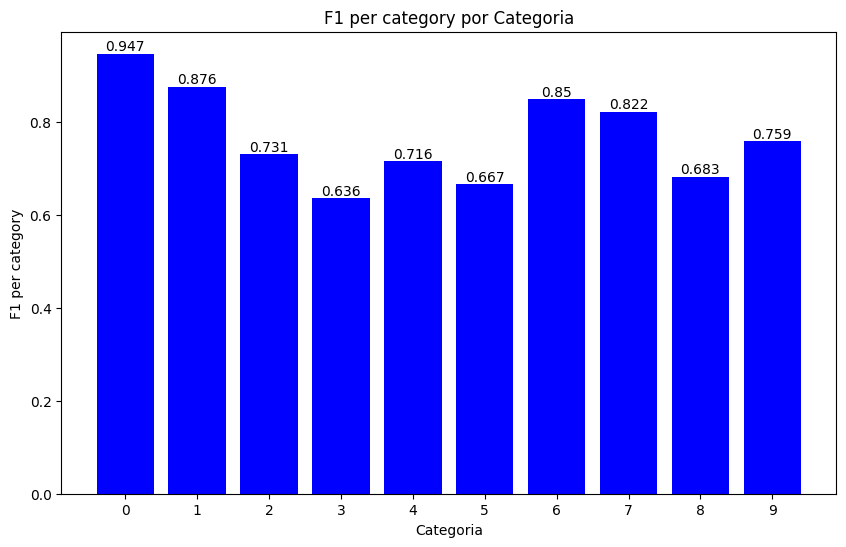

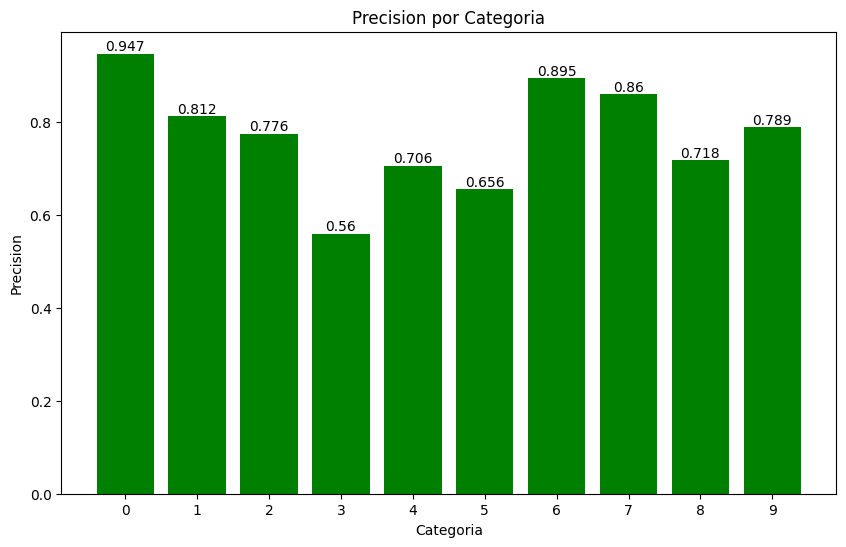

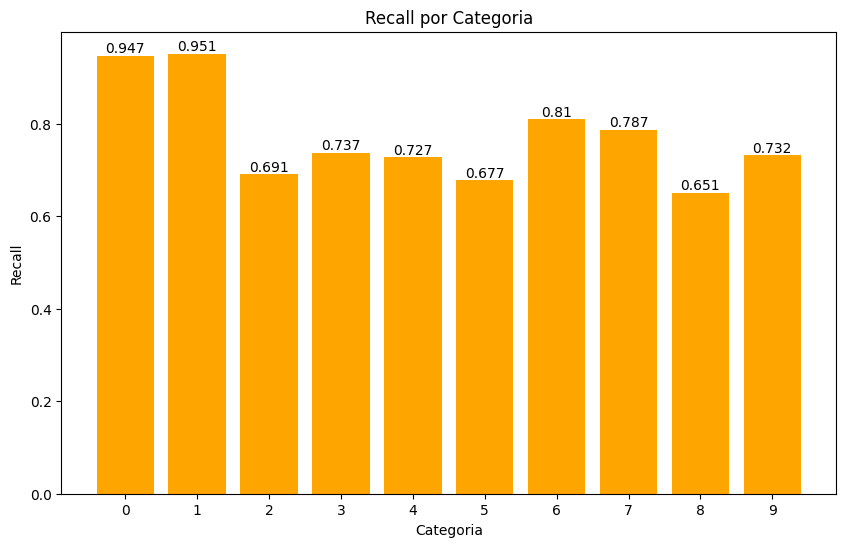

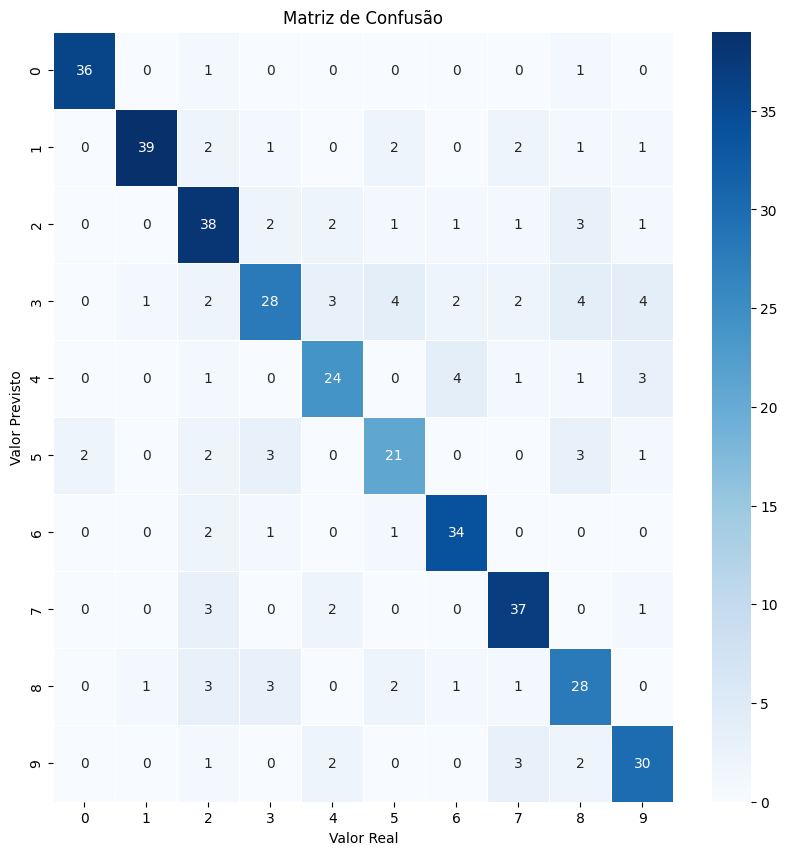


Macro f1: 0.7934541399391477

Accuracy: 0.7970660146699267



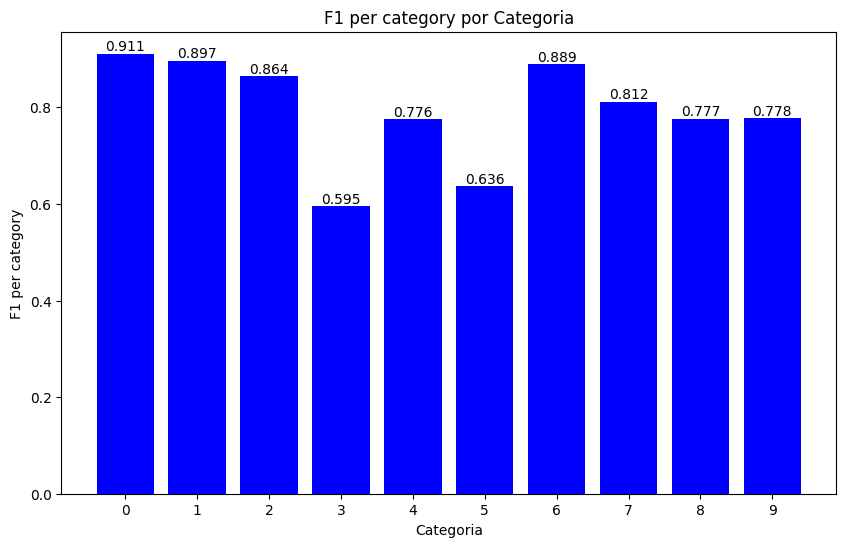

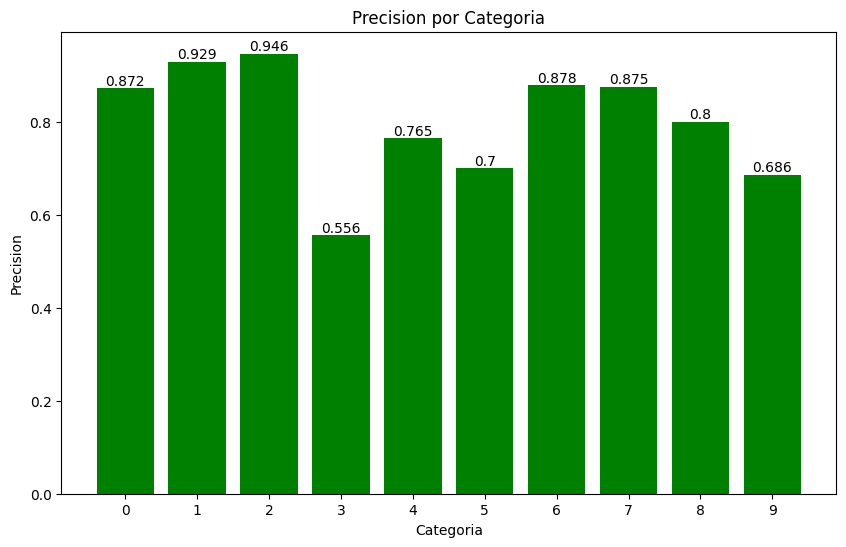

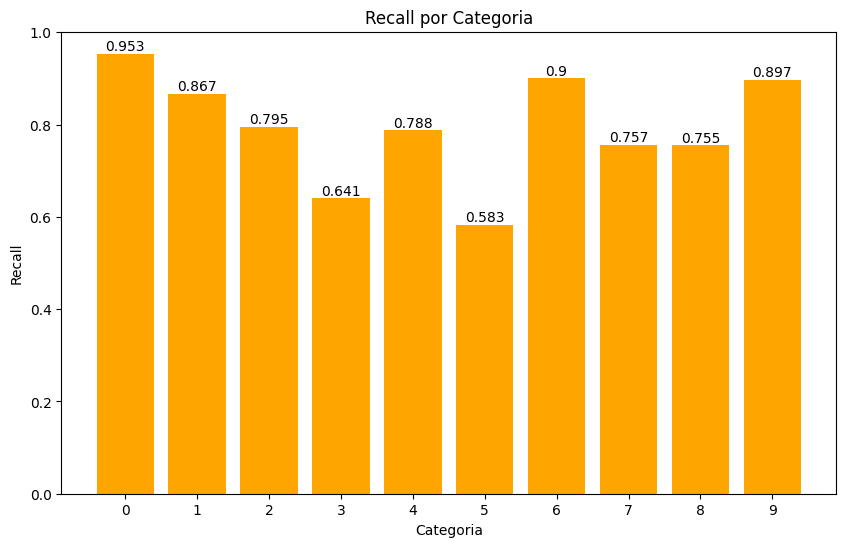

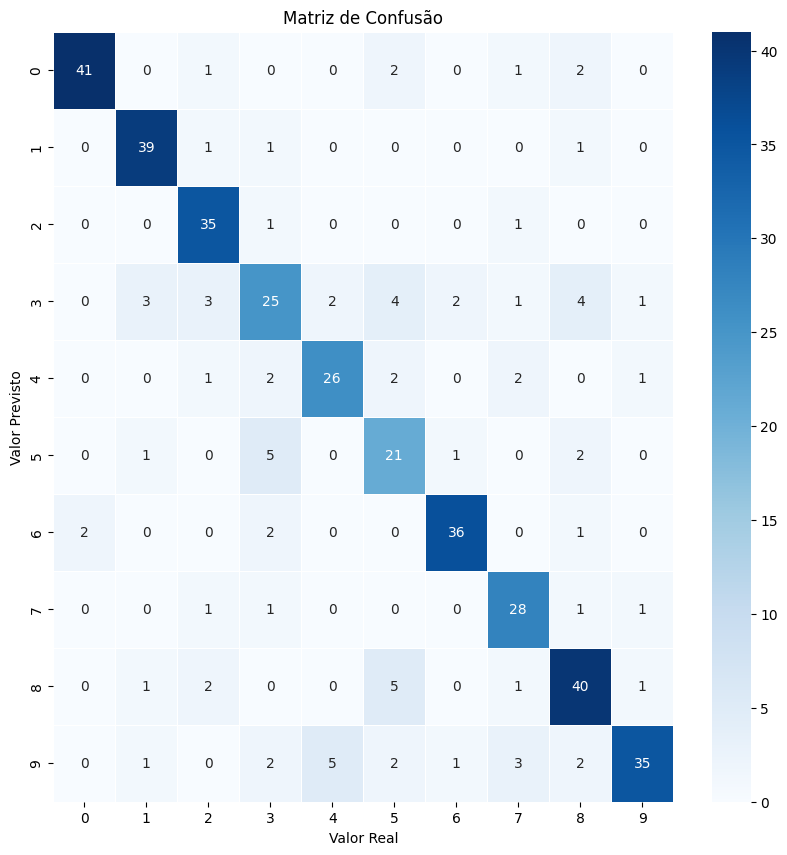


Macro f1: 0.794964322877631

Accuracy: 0.7970660146699267



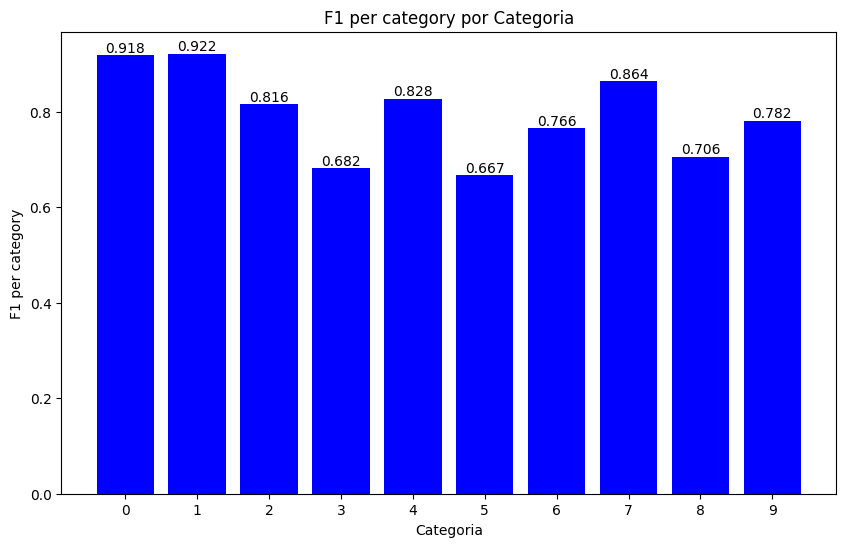

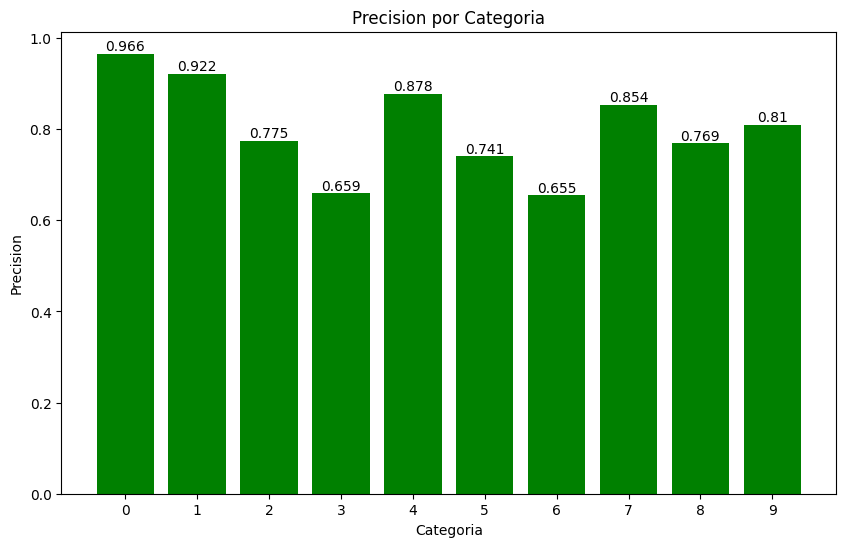

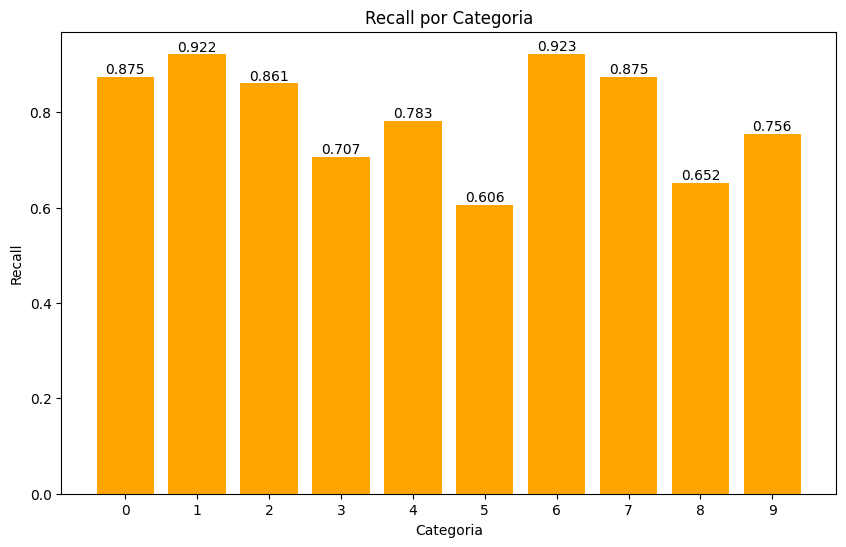

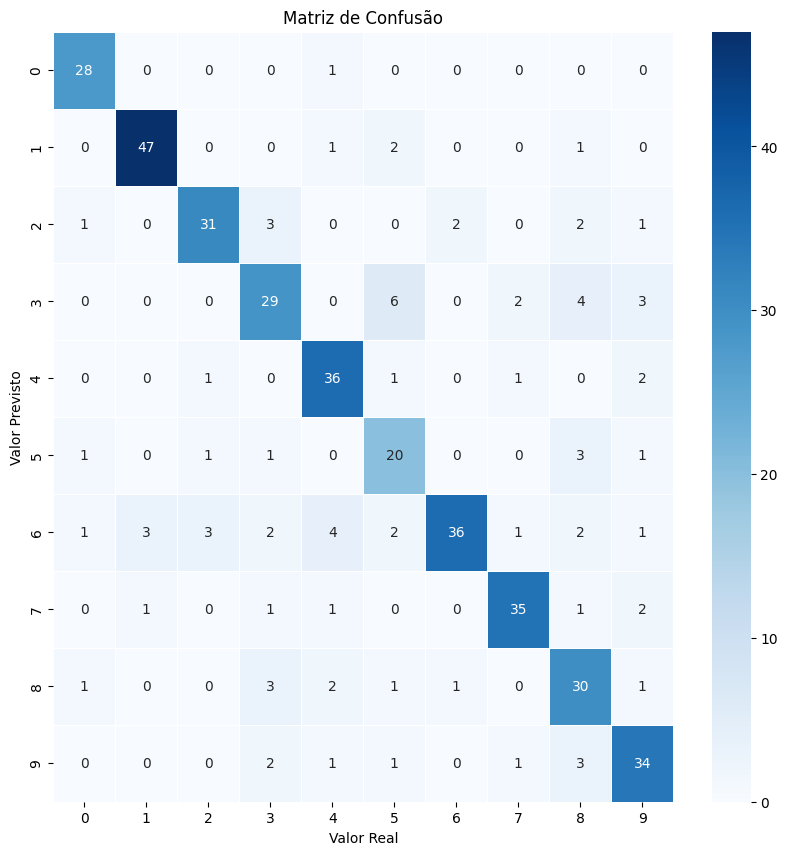


Macro f1: 0.7827983317433018

Accuracy: 0.7897310513447433



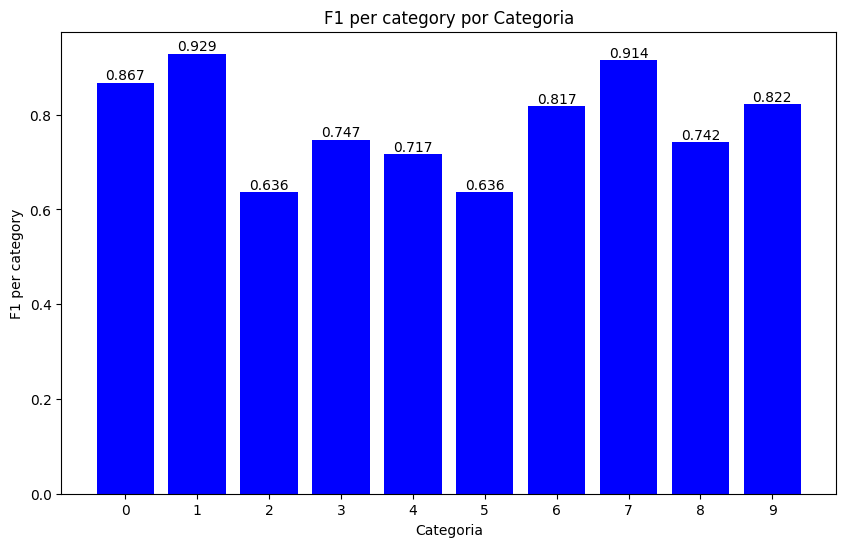

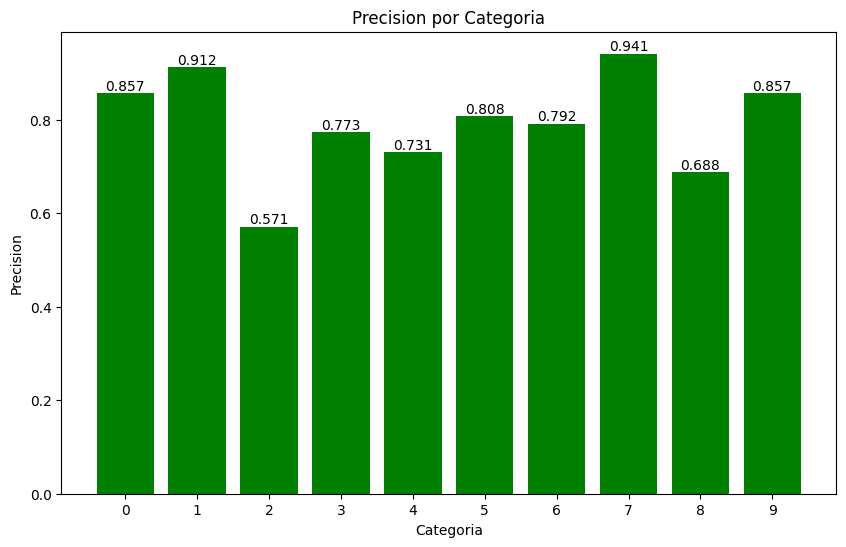

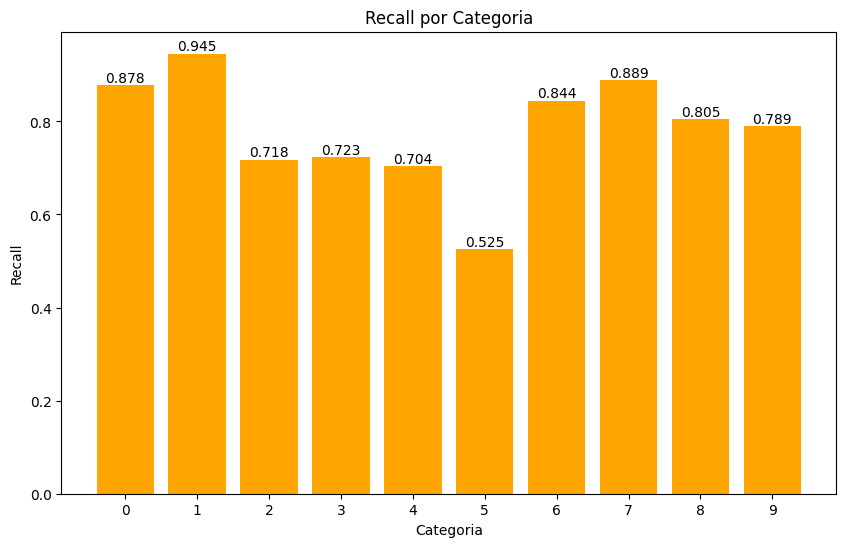

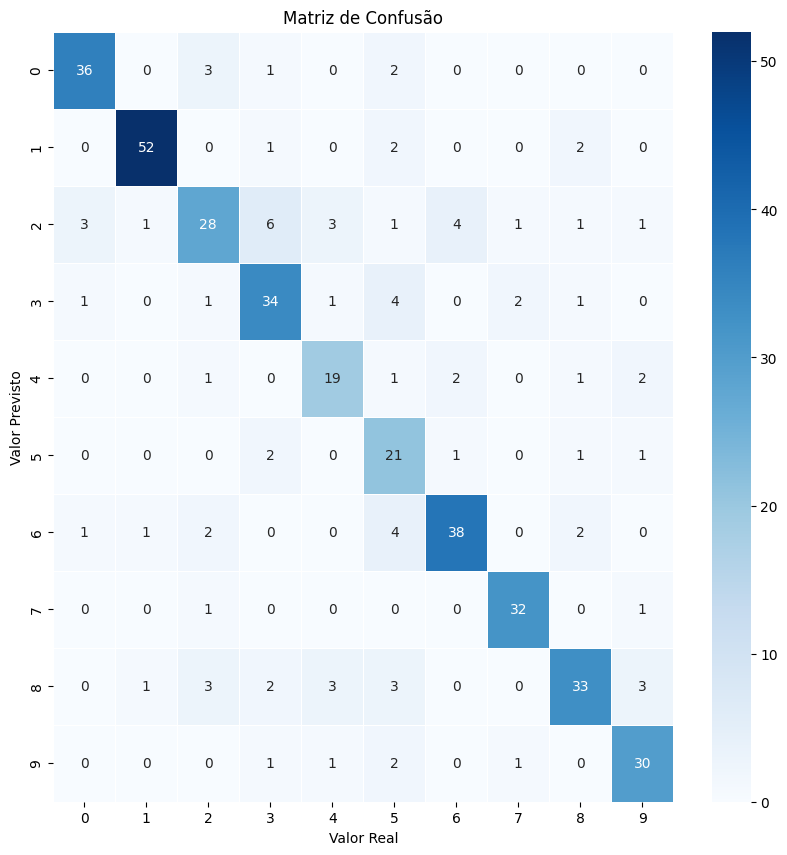


Macro f1: 0.7122668682100964

Accuracy: 0.7167070217917676



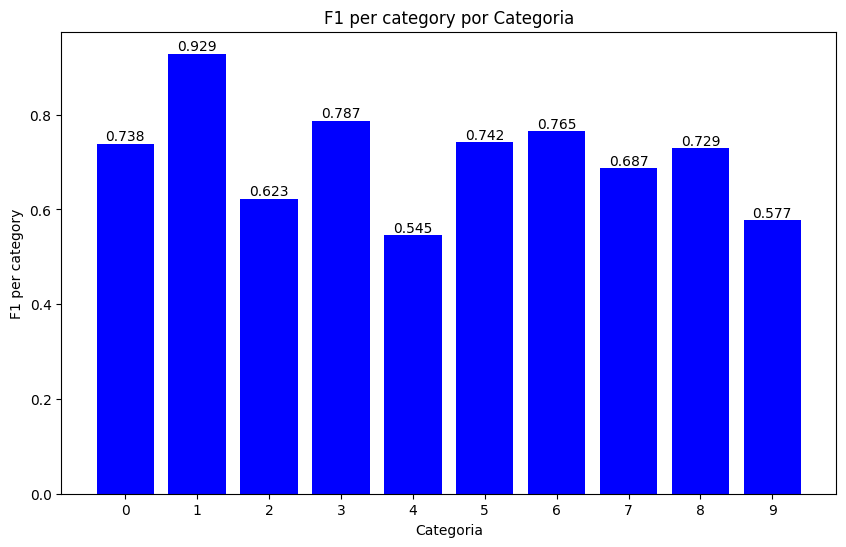

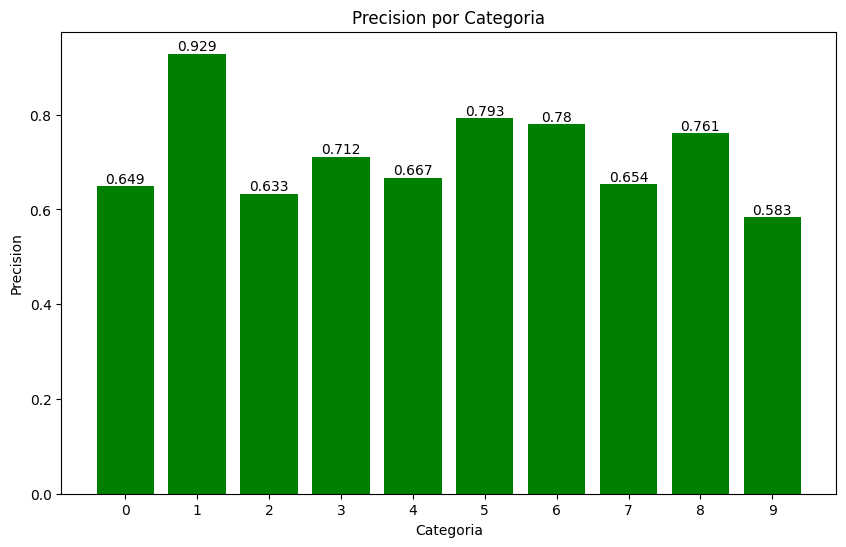

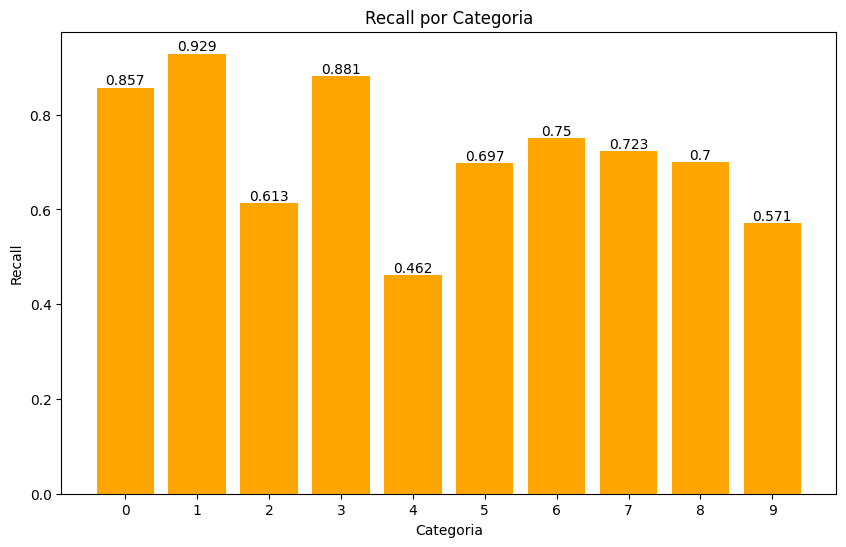

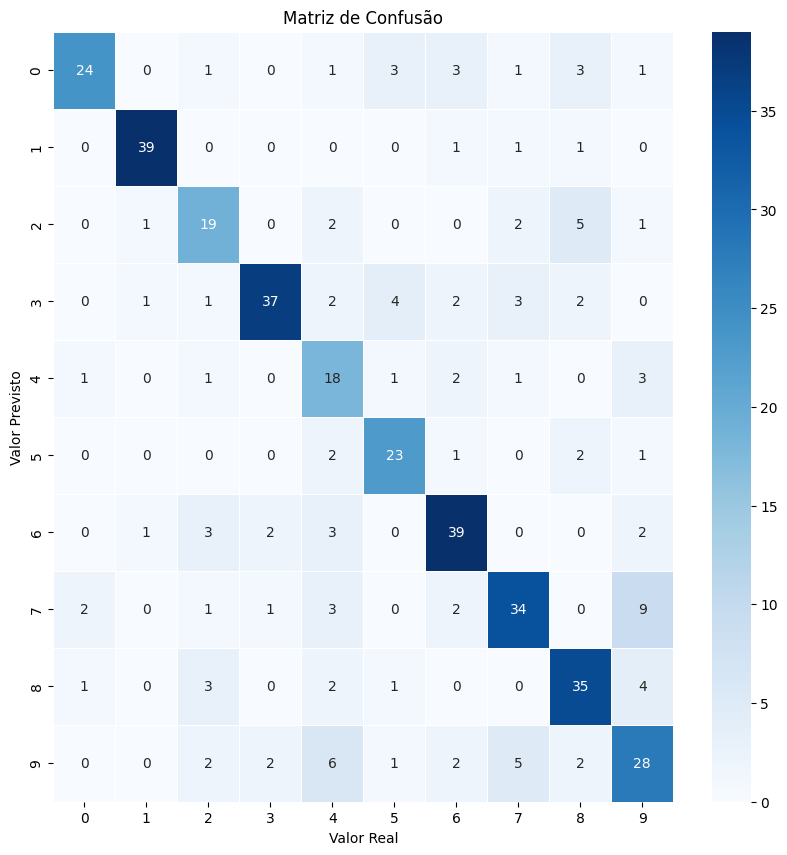

In [21]:
show_results("Random Forest 20x20 Binary Input", numbers, exp)